<a href="https://colab.research.google.com/github/iviterirambay/Coursera_Capstone/blob/master/Capstone_Project%20(WEEK%20TWO).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# IBM Applied Data Science Capstone Project

This capstone project will be graded by your peers. This capstone project is worth 70% of your total grade. The project will be completed over the course of 2 weeks. Week 1 submissions will be worth 30% whereas week 2 submissions will be worth 40% of your total grade.

# **WEEK ONE**

## 1.- A description of the problem and a discussion of the background. (15 marks)

**Business Understanding**
Road traffic accidents are a major source of human and economic hardship in most advanced
economies, with consequences which can range from minor property/vehicular damage, to
major damage, personal injury or death. It is estimated that road traffic accidents cost the
United States’ economy ∼ $810 billion per year, including costs due to property damage,
legal costs and associated medical bills. It is therefore of paramount importance that
we understand the factors influencing the likelihood of a road traffic accident occuring at a
given location, as well as those which influence the severity of those accidents that do occur.
Intuitively, we might expect that some of the factors which influence the likelihood and
severity of a road traffic accident include: the weather, local road contitions (i.e. highways,
urban areas or rural roads), time of day (and the presence or absence of street lights),
and the number and type of vehicles in the area. Additional factors which may influence
the frequency and severity of road traffic accidents include those which can be traced to
individual irresponsibility, such as driving under the influence of alcohol/narcotics, driving
without due care and attention or driving at excessive speed. While it is intuitive that a
combination of these factors may be important, intuition alone cannot determine the relative
significance of these factors, which is required in order fully understand the causes of road
traffic accidents and devise new strategies to minimise their occurrance and severity.
The target audience for this work will be city planners and emergency service responders: it is hoped that by understanding the factors influencing the frequency and severity of
accidents, it will be possible to improve the design of the road network and better prepare
for how to deal with accidents when they unfortunatley arise.


## 2.- A description of the data and how it will be used to solve the problem. (15 marks)

**Data Understanding**
I will use the Cross-Industry Standard Process for Data Mining (CRISP-DM) in order to
quantify the impact of these factors on the frequency and severity of car accidents. I will build
and test Machine Learning models using data for 221,006 road traffic accidents in the Seattle
municipal area between 2004–2020, recorded by Seattle Department of Transport (SDOT)
and obtained from the Seattle Open Data Portal. Note that these data
were obtained from the Seattle Open Data Portal directly, and that the dataset
differs in number of rows and columns from the example dataset provided in the
IBM Data Science Capstone introduction. Moreover, the severitycode target
variable takes on one of five discrete values, rather than the binary options
presented in the test dataset.
The data can be downloaded in Comma Separated Value (CSV) format and read in to a
Pandas Dataframe using the Pandas read_csv function, and the contents and data types
displayed using the head and dtypes functions. A Jupyter Notebook containing the code
for exploring of the dataset, along with data cleaning, model building and model evaluation
will be submitted and published on GitHub in next week’s submission.
The target/dependent variable is severitycode which, in its default form, takes the values 0, 1, 2, 2b or 3. The definitions of these severity codes are provided in the “Attribute Information” metadata which accompany the data release and are given:

    |-------------------------------------------|
    |        Severity Code Meaning              |
    |----------------|--------------------------|
    |         0      |       Unknown            |
    |----------------|--------------------------|
    |         1      |    Property Damage       |
    |----------------|--------------------------|
    |         2      |    Injury (Minor)        |
    |----------------|--------------------------|
    |         2b     |    Injury (Serious)      |
    |----------------|--------------------------|
    |         3      |        Fatality          |
    |----------------|--------------------------|

Note that only 4 rows and 12 columns are visible on the screenshot; the remaining 21 rows and 28 colums are visible within the Notebook using scroll bars. We see that some columns contain duplicate/redundant data (inckey,
coldetkey), while others contain categorical (addrtype) or no data (exceptrsncode). Cleaning of the data will be essential before meaningful analysis and modelling can be undertaken.

**Data Preparation**
In its original form, this dataset is not suitable for quantitative analysis. There are three key reasons for this:
1. The dataset contains columns which are superfluous (i.e. they contain information
which is unrelated to the causes or severity of accidents) or are redundant (i.e. they
largely replicate information which is already present in other columns). Examples
of superfluous columns include objectid, inckey and coldetkey, which all identify the accident records with respect to other data held by SDOT which are not included in this dataset. Examples of redundant columns include severitydesc (which
provides a textual description of the accompanying severitycode) and sdot_colcode/sdot_coldesc (which replicate the information that is in the st_colcode
column).
2. The dataset contains categorical data, e.g. weather, which takes one of eleven categorical values, or roadcond which describes road conditions and takes one of eight
categorical values. Machine learning models require numerical data, not categorical
data. For this reason it will also be necessary to re-cast the accident severity scale
such that it is strictly numerical: 0, 1, 2, 2b, 3 → 0, 1, 2, 3, 4.
3. The dataset contains missing entries, where one or more of the key predictor variables
are absent or uninformative (e.g. 6.8% of accidents have “Unknown” listed in the
weather column). Including these data entries in the model is likely to increase noise.
In some cases, the target variable itself is not in a usable form (4.25% of accidents have
severitycode “Unknown”). We see that some dependent variables are categorical (of type
object), whereas they need to be numerical for most Machine Leaning approaches to work. We will use
one-hot encoding to recast each of these categorical variables as a series of numerical variables, with values
0 or 1.
4. The numerical data are imbalanced (there are ∼ 345× as many accidents with severitycode=1 as there are accidents with severitycode=3) and are not well normalised
(e.g. after one-hot encoding many of the categorical variables will be assigned binary
values 0/1, whereas the latitude, X and longitude, Y of the accident location are in
decimal degrees, and typically cluster around X = −122.33, Y = 47.61)
In order to use this dataset to build and evaluate a Machine Learning model for predicting accident severity it will be necessary to clean the data using the following standard
techniques: (i) discarding rows which are missing crucial data; (ii) discarding columns which
contain unnecessary/redundant data; (iii) use of one-hot encoding to create numerical data
from categorical variables; (iv) data balancing using downsampling techniques; (v) feature
scaling using scikitlearn’s standardscaler function.

**Modelling, Evaluation and Deployment** (a forward look)
After cleaning the data I will split the data in to testing (30%) and training (70%) subsamples
using train_test_split, and will then build the following three models for evaluation:
1. K-Nearest Neighbour (KNN): this model will attempt to predict the severity of the
accident in the test dataset based on the severity of the K accidents whose preceding
conditions are most similar in the training dataset.
2. Decision Tree: this model will build a decision tree by splitting and branching the
data on all the possible values of every attribute in the dataset in order to determine
the most predictive features in the dataset. The decision tree will then be used to
predict the severity of an accident in the test dataset based on the values of those
predictive features.
3. Support Vector Machine (SVM): the target variable severitycode is not binary
in this dataset, and therefore is not suited to logistic regression techniques. Instead,
SVM will be used to map the training data to a multi-dimensional space (allowing
hyperplanes to be fit which cleanly separate accidents with different severitycodes),
and then these hyperplanes will be used to predict the severitycode of accidents in
the test dataset, given the values of its independent variables.
Having built these three models I will then evaluate them using the F1 and Jaccard
Similarity scores in order to identify the best model.
It is hoped that the best-performing model would then be suitable for deployment and
capable of providing useful results to guide the decision-making of town planning authorities
and emergency service responders in order to reduce the frequency of accidents and lessen
their severity.

# **WEEK TWO**

## 1.- A link to your Notebook on your Github repository, showing your code. (15 marks)

## 2.- A full report consisting of all of the following components (15 marks):

### Introduction where you discuss the business problem and who would be interested in this project.

Road traffic accidents are estimated to cost the US economy ~$810bn per year in property damage, medical costs, legal bills and loss of earnings. Identifying the factors which influence accident severity is therefore of paramount importance.
It may seem intuitive and obvious that the occurrence and severity of road traffic accidents will be related to a number of factors including environmental conditions (weather, road surface conditions and lighting conditions), time of day/day of week, irresponsible driving (speeding, driving under the influence of alcohol/drugs, or simply not paying attention) and the angles and speeds at which vehicles collide. However, determining the manner in which these various factors interact to determine the severity of car accidents in a given state/city is not a trivial undertaking. While a number of these features may individually serve as good predictors of accident severity on their own, some of them seldom occur together: for instance, head-on collisions often involve serious injuries and fatalities, as do collisions on freeways (primarily due to the high speeds involved). However head-on collisions on freeways are relatively rare, due to the presence of barriers separating traffic travelling in different directions. How can we incorporate these features in to a cohesive understanding of road accident outcomes?
We can begin to unpick this complicated problem and gain insight into the factors which influence accident severity by studying data from past accidents, and then use Machine Learning techniques to create models to predict the severity of future/unfolding accidents based on the similarity of their initial conditions to those of other accidents in the historical record.
The two main beneficiaries of building this kind of model are town/city planners, who may be able to use the model to inform their road planning and traffic calming strategies and emergency service responders, who may be able to use the model to predict the severity of an accident based on information that’s provided at the time the accident is reported in order to optimally allocate resources across the city.

### Data where you describe the data that will be used to solve the problem and the source of the data.

In their original form, the Seattle accident data are not suitable for quantitative data analysis. The main reasons for this are as follows:
Data incompleteness: around 15% of the accidents in the dataset are missing one or more key features, including in some cases the target variable (accident severity code) and in others, are missing information about weather or road conditions. As the purpose of building the model is to see how these various features interact and influence the overall accident severity, data entries which are missing one or more of these key features are not useful, and were removed from the dataset.
Dataset includes unnecessary/redundant columns: the accident dataset includes many columns of metadata (such as incident report numbers) and columns which duplicate information which is already included in other columns (such as a text field “SEVERITYDESC” which provides a written definition of the accompanying accident severity code, the target variable). Columns which include unnecessary/redundant information were removed from the dataset.
Presence of categorical/non-numeric data: Machine Learning models require numerical data, and cannot handle alphanumeric strings. For example, each entry in the “WEATHER” column contains a text string which takes one of eleven values (e.g. “Clear”, “Rain”, “Snow”, etc) which describes the prevailing weather conditions at the time of the accident. Columns such as this were re-engineered to allow data analysis using the “One-Hot Encoding” technique², which replaces the input textual column with a series of binary columns (containing 1 or 0) relating to each possible value in the input column.
Data are imbalanced and non-standardised: the target variable for this model is the accident severity code. Fortunately, the majority of accidents in Seattle (>97%) involve either no or minor injuries, and so the number of accidents with SEVERITYCODE=3 is very much less than the number of accidents with SEVERITYCODE=1. However this imbalance between the real-life occurrences of different accident outcomes may bias the model if not accounted for. To create the least-biased model, we re-sample the dataset by randomly-selecting a number of accidents (327) with severity codes 1, 2 and 2b which matches the total number of accidents in the dataset with severity code 3. Furthermore, the data are non-standardised: most of the data columns after data engineering have values of the order ~1, however a few columns (e.g. X, Y, giving the longitude and latitude of the accident, and YEAR) have numerical values which are orders of magnitude higher. To allow the model to identify the key features without being biased by the imbalance in data values, the data were standardised (i.e. every column re-scaled to have ~zero mean and ~unit variance) using the scikit learn StandardScaler routine.

In [3]:
#Import some useful packages
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import time
import seaborn as sns
from tqdm.auto import tqdm, trange

!pip install pyscreenshot

#Set up parallel processing
import concurrent.futures
import multiprocessing
num_processes = multiprocessing.cpu_count()
print("There are "+str(num_processes)+" logical cores on this system.")
global_starttime = time.time()

There are 2 logical cores on this system.


In [4]:
!wget -O Collisions.csv https://opendata.arcgis.com/datasets/5b5c745e0f1f48e7a53acec63a0022ab_0.csv
#Read data from the downloaded CSV file and import in to a Pandas dataframe
df = pd.read_csv("Collisions.csv")

#Get the size of the original dataset prior to cleaning
#This will be useful when we later quantify what percentage of the
#data we lose during cleaning.
df_shape_orig = df.shape
print("Shape of the original data frame: "+str(df.shape[0])+' x '+str(df.shape[1]))

--2020-10-03 16:39:38--  https://opendata.arcgis.com/datasets/5b5c745e0f1f48e7a53acec63a0022ab_0.csv
Resolving opendata.arcgis.com (opendata.arcgis.com)... 3.221.234.207, 52.45.166.77, 34.198.223.29, ...
Connecting to opendata.arcgis.com (opendata.arcgis.com)|3.221.234.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘Collisions.csv’

Collisions.csv          [       <=>          ]  81.10M  65.7MB/s    in 1.2s    

2020-10-03 16:39:41 (65.7 MB/s) - ‘Collisions.csv’ saved [85042856]

Shape of the original data frame: 221738 x 40


In [5]:
#Check the first few rows of data to see what we are dealing with
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df.head(25)

,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,LOCATION,EXCEPTRSNCODE,EXCEPTRSNDESC,SEVERITYCODE,SEVERITYDESC,COLLISIONTYPE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INJURIES,SERIOUSINJURIES,FATALITIES,INCDATE,INCDTTM,JUNCTIONTYPE,SDOT_COLCODE,SDOT_COLDESC,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,-122.356511,47.517361,1,327920,329420,3856094,Matched,Intersection,34911.0,17TH AVE SW AND SW ROXBURY ST,,NaN,1,Property Damage Only Collision,Angles,2,0,0,2,0,0,0,2020/01/19 00:00:00+00,1/19/2020 9:01:00 AM,At Intersection (intersection related),11.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",NaN,N,Clear,Dry,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,-122.361405,47.702064,2,46200,46200,1791736,Matched,Block,NaN,HOLMAN RD NW BETWEEN 4TH AVE NW AND 3RD AVE NW,NaN,NaN,1,Property Damage Only Collision,Rear Ended,2,0,0,2,0,0,0,2005/04/11 00:00:00+00,4/11/2005 6:31:00 PM,Mid-Block (not related to intersection),14.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",Y,0,Raining,Wet,Dusk,NaN,5101020.0,NaN,13,From same direction - both going straight - bo...,0,0,N
2,-122.317414,47.664028,3,1212,1212,3507861,Matched,Block,NaN,ROOSEVELT WAY NE BETWEEN NE 47TH ST AND NE 50T...,,NaN,2,Injury Collision,Head On,2,0,0,2,1,0,0,2013/03/31 00:00:00+00,3/31/2013 2:09:00 AM,Mid-Block (not related to intersection),11.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",NaN,N,Clear,Dry,Dark - Street Lights On,NaN,NaN,NaN,30,From opposite direction - all others,0,0,N
3,-122.318234,47.619927,4,327909,329409,EA03026,Matched,Intersection,29054.0,11TH AVE E AND E JOHN ST,,NaN,2,Injury Collision,Pedestrian,3,1,0,1,1,0,0,2020/01/06 00:00:00+00,1/6/2020 5:55:00 PM,At Intersection (intersection related),24.0,MOTOR VEHCILE STRUCK PEDESTRIAN,NaN,N,Raining,Wet,Dark - Street Lights On,NaN,NaN,NaN,0,Vehicle going straight hits pedestrian,0,0,N
4,-122.351724,47.560306,5,104900,104900,2671936,Matched,Block,NaN,WEST MARGINAL WAY SW BETWEEN SW ALASKA ST AND ...,NaN,NaN,2,Injury Collision,Other,2,0,0,1,1,0,0,2009/12/25 00:00:00+00,12/25/2009 7:00:00 PM,Mid-Block (not related to intersection),28.0,MOTOR VEHICLE RAN OFF ROAD - HIT FIXED OBJECT,NaN,0,Clear,Ice,Dark - Street Lights On,NaN,9359012.0,Y,50,Fixed object,0,0,N
5,-122.333067,47.544302,6,322205,323705,3694789,Matched,Block,NaN,1ST AV S NB OFF RP BETWEEN 1ST AV S BR NB AND ...,,NaN,1,Property Damage Only Collision,Rear Ended,2,0,0,2,0,0,0,2019/08/08 00:00:00+00,8/8/2019 12:49:00 PM,Mid-Block (not related to intersection),14.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",NaN,N,Clear,Dry,Daylight,NaN,NaN,NaN,14,From same direction - both going straight - on...,0,0,N
6,-122.338543,47.616874,7,322275,323775,E949282,Matched,Block,NaN,8TH AVE BETWEEN WESTLAKE AVE AND BLANCHARD ST,,NaN,1,Property Damage Only Collision,Cycles,3,0,1,1,0,0,0,2019/08/08 00:00:00+00,8/8/2019 8:57:00 AM,Mid-Block (not related to intersection),18.0,"MOTOR VEHICLE STRUCK PEDALCYCLIST, FRONT END A...",Y,N,Overcast,Dry,Daylight,NaN,NaN,NaN,5,Vehicle Strikes Pedalcyclist,0,0,N
7,NaN,NaN,8,5721,5721,1786583,Unmatched,NaN,NaN,NaN,NEI,"Not Enough Information, or Insufficient Locati...",1,Property Damage Only Collision,Parked Car,0,0,0,2,0,0,0,2007/08/27 00:00:00+00,8/27/2007,Mid-Block (not related to intersection),13.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, LEFT SIDE ...",NaN,0,Clear,Dry,Daylight,NaN,3239035.0,NaN,32,One parked--one moving,0,0,N
8,-122.360959,47.571594,9,33400,33400,1076890,Matched,Block,NaN,WEST SEATTLE BR WB BETWEEN W SEATTLE BR WB OFF...,NaN,NaN,2b,Serious Injury Collision,Rear Ended,3,0,0,3,3,1,0,2005/07/06 00:00:00+00,7/6/2005,Mid-Block (not related to intersection),14.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",Y,0,Clear,Dry,Daylight,NaN,5187041.0,NaN,13,From same direction - both going straight - bo...,0,0,N
9,-122.336856,47.655652,10,20400,20400,1220377,Matched,Block,NaN,N 40TH ST BETWEEN DENSMO

In [6]:
#Check the types of data in the dataframe
df.dtypes

X                  float64
Y                  float64
OBJECTID             int64
INCKEY               int64
COLDETKEY            int64
REPORTNO            object
STATUS              object
ADDRTYPE            object
INTKEY             float64
LOCATION            object
EXCEPTRSNCODE       object
EXCEPTRSNDESC       object
SEVERITYCODE        object
SEVERITYDESC        object
COLLISIONTYPE       object
PERSONCOUNT          int64
PEDCOUNT             int64
PEDCYLCOUNT          int64
VEHCOUNT             int64
INJURIES             int64
SERIOUSINJURIES      int64
FATALITIES           int64
INCDATE             object
INCDTTM             object
JUNCTIONTYPE        object
SDOT_COLCODE       float64
SDOT_COLDESC        object
INATTENTIONIND      object
UNDERINFL           object
WEATHER             object
ROADCOND            object
LIGHTCOND           object
PEDROWNOTGRNT       object
SDOTCOLNUM         float64
SPEEDING            object
ST_COLCODE          object
ST_COLDESC          object
S

In [7]:
print(df.loc[0,:])

X                                                           -122.357
Y                                                            47.5174
OBJECTID                                                           1
INCKEY                                                        327920
COLDETKEY                                                     329420
REPORTNO                                                     3856094
STATUS                                                       Matched
ADDRTYPE                                                Intersection
INTKEY                                                         34911
LOCATION                               17TH AVE SW AND SW ROXBURY ST
EXCEPTRSNCODE                                                       
EXCEPTRSNDESC                                                    NaN
SEVERITYCODE                                                       1
SEVERITYDESC                          Property Damage Only Collision
COLLISIONTYPE                     

In [8]:
#Check where there are NaNs in the dataframe
print(df.isnull().sum(axis=0))

X                    7478
Y                    7478
OBJECTID                0
INCKEY                  0
COLDETKEY               0
REPORTNO                0
STATUS                  0
ADDRTYPE             3714
INTKEY             149711
LOCATION             4593
EXCEPTRSNCODE      120403
EXCEPTRSNDESC      209953
SEVERITYCODE            1
SEVERITYDESC            0
COLLISIONTYPE       26451
PERSONCOUNT             0
PEDCOUNT                0
PEDCYLCOUNT             0
VEHCOUNT                0
INJURIES                0
SERIOUSINJURIES         0
FATALITIES              0
INCDATE                 0
INCDTTM                 0
JUNCTIONTYPE        11979
SDOT_COLCODE            1
SDOT_COLDESC            1
INATTENTIONIND     191550
UNDERINFL           26431
WEATHER             26641
ROADCOND            26560
LIGHTCOND           26730
PEDROWNOTGRNT      216543
SDOTCOLNUM          94533
SPEEDING           211802
ST_COLCODE           9413
ST_COLDESC          26451
SEGLANEKEY              0
CROSSWALKKEY

####**Data Cleaning**

##### *Rows which are missing information about the target variable.*
The objective of this model is to predict the car accident severity code ( SEVERITYCODE ) from the given features. However as we can see from the previous cell, there are 21,602 accidents in the dataframe with SEVERITYCODE =0, corresponding to an accident with "Unknown" severity. Clearly we cannot use accidents whose severity is unknown to train/test a model designed to predict accident severity, so these rows will be dropped.

In [9]:
#Check for and remove any rows with SEVERITYDESC = "Unknown"
print("Give a run-down of the values present in the table for SEVERITYCODE:")
print(df["SEVERITYDESC"].value_counts())

#Identify and remove rows with SEVERITYDESC = "Unknown"
todrop = df["SEVERITYDESC"] == 'Unknown'
print("\n Preparing to drop "+str(todrop.values.sum())+" rows.")
df.drop(df.index[todrop], inplace=True)
print("Done!")

#Re-index dataframe to account for missing rows
df.reset_index(inplace=True)

Give a run-down of the values present in the table for SEVERITYCODE:
Property Damage Only Collision    137776
Injury Collision                   58842
Unknown                            21657
Serious Injury Collision            3111
Fatality Collision                   352
Name: SEVERITYDESC, dtype: int64

 Preparing to drop 21657 rows.
Done!


##### *Columns containing useless/redundant data.*
These columns can be removed from the dataframe and include:

***OBJECTID*** - this is just an database key, but Pandas creates its own key on import.

***COLDETKEY*** - this is just a duplicate of INCKEY, and probably arises due to a cross-matching of tables on the Seattle Open Data website. We will keep INCKEY as a unique identifier for each accident, but do not need to keep the duplicate column


***REPORTNO*** - this is just another identifier for the accident, this time tying the record to the individual piece of paperwork that was filed to report the accident. This is not useful for building our model.


***STATUS*** - the meaning of this column is unclear (and is not explained in the Attribute Information metadata). The values are either "Matched" or "Unmatched".

***EXCEPTRSNCODE, EXCEPTRSNDESC*** - these columns are listed in the Attribute Information metadata, but their meanings are not explained. EXCEPTRSNCODE is blank/NaN in ~99% of the data, with 2,480 accidents having a non-blank entry, all of which are the same ("NEI"). According to EXCEPTRSNDESC this means "Not Enough Information".

***INCDATE*** - this column is just a duplicate of the more easily parsable INCDTTM

***SDOTCOLNUM*** - this is another unique identifier for each accident, however as we are planning to keep INCKEY, keeping this second unique identifier is redundant.


In [10]:
#Begin by checking whether these columns exists in the dataset and if so, delete them:
if 'OBJECTID' in df:
    del df["OBJECTID"]
if 'COLDETKEY' in df:
    del df["COLDETKEY"]
if 'REPORTNO' in df:
    del df["REPORTNO"]
if 'STATUS' in df:
    del df["STATUS"]
if 'EXCEPTRSNCODE' in df:
    del df["EXCEPTRSNCODE"]
if 'EXCEPTRSNDESC' in df:
    del df["EXCEPTRSNDESC"]
if 'INCDATE' in df:
    del df["INCDATE"]
if 'SDOTCOLNUM' in df:
    del df["SDOTCOLNUM"]
if 'STCOLCODE' in df:
    del df["STCOLCODE"]

##### *Rows which are missing information about some of the features which we expect will be key to building the model.*
As we can see from df.head, a number of accidents (accounting for ~15% of the dataset) have "Unknown" values for attributes like WEATHER , ROADCOND and LIGHTCOND , or have these fields blank/NaN, which in practice means the same thing. As these are expected to be among the features which influence the likelihood and severity of accidents, we have to consider discarding these rows before training the model.

In [11]:
#Find missing WEATHERCOND
todrop1 = df["WEATHER"] == 'Unknown'
noweatherinfo = todrop1.values.sum()

#Find missing ROADCOND
todrop2 = df["ROADCOND"] == "Unknown"
noroadcondinfo = todrop2.values.sum()

#Find missing LIGHTCOND
todrop3 = df["LIGHTCOND"] == "Unknown"
nolightinfo = todrop3.values.sum()

#Collate these and remove
df["TODROP"] = 0
count_noweather = 0
count_noinfo = 0
for i in range(0,len(todrop1)):
    if todrop1[i] == True or todrop2[i] == True or todrop3[i] == True:
        df["TODROP"][i] = 1
        
print("There are "+str(noweatherinfo)+" accidents with no weather information.")
print("There are "+str(noroadcondinfo)+" accidents with no road condition information.")
print("There are "+str(nolightinfo)+" accidents with no information about light conditions.")
print("There are "+str(df["TODROP"].values.sum())+" accidents without one or more of the above.\n Deleting now...")

#Delete the temporary column "TODROP" and re-index the data
shape0 = df.shape
todrop = df["TODROP"] == 1
df.drop(df.index[todrop], inplace=True)

#Print info about DF shape before and after
print("Shape of DF before: "+str(shape0[0])+" x "+str(shape0[1]))
print("Shape of DF after: "+str(df.shape[0])+" x "+str(df.shape[1]))
print("The original DF had shape: "+str(df_shape_orig[0])+" x "+str(df_shape_orig[1]))

#Re-index dataframe to account for missing rows
df.reset_index(inplace=True)

#Delete the temporary "TODROP" column from the DataFrame
if 'TODROP' in df:
    del df["TODROP"]
    del df["level_0"]
    del df["index"]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


There are 15131 accidents with no weather information.
There are 15139 accidents with no road condition information.
There are 13533 accidents with no information about light conditions.
There are 19008 accidents without one or more of the above.
 Deleting now...
Shape of DF before: 200081 x 34
Shape of DF after: 181073 x 34
The original DF had shape: 221738 x 40


##### *Presence of features with categorical values.*
In order to construct a model using Machine Learning techniques, we must take columns which contain categorical data and re-cast them in numeric form. Different techniques will be used to accomplish this, depending on the nature of the data in these columns.


*   Awkwardly, the target variable SEVERITYCODE is itself a categorical variable, having the values [0, 1, 2, 2b, 3]. For reasons given previously, we will be dropping all accidents with SEVERITYCODE =0, however we are still left with the categorical value '2b'. To facilitate modelling, I will switch the codes [0, 1, 2, 2b, 3] for codes [0, 1, 2, 3, 4], i.e. relabelling '2b' as '3', and relabelling '3' as '4'.

*   Some columns, such as UNDERINFL and HITPARKEDCAR contain a mixture of alphanumeric (Y/N or 1/0), boolean (True/False) and missing (NaN) data. To prepare the data for modelling it will be important to homogenise these data by treating 1, Y and True as equivalent (and setting these to 1) and treating 0, N and False as equivalent (setting these to 0). Furthermore, we can infer that missing values (represented with NaN) are equivalent to 0/False.
*   Other columns contain labelled data (e.g. WEATHERCOND , which takes one of a handful of values such as RAIN , CLEAR , SNOWING , etc). These can be prepared for modelling by using One-Hot Encoding, wherein a new column is created for each of the discrete values corresponding to the original variable/column, which is filled with 1s or 0s depending on the value in that column.

In [12]:
#Make the target variable numerical by changing [0, 1, 2, 2b, 3] to [0, 1, 2, 3, 4]
#Print the range of codes before cleaning:
print(df["SEVERITYCODE"].value_counts())

#Clean...
count2b = 0
count3  = 0
for i in range(0,len(df["SEVERITYCODE"])):
    if df["SEVERITYDESC"][i] == 'Serious Injury Collision':
        df["SEVERITYCODE"][i] = 3
        count2b += 1
    if df["SEVERITYDESC"][i] == 'Fatality Collision':
        df["SEVERITYCODE"][i] = 4
        count3 += 1
        
#Make sure that SEVERITYCODE is cast as an integer, rather than an object
df = df.astype({'SEVERITYCODE':np.int})
        
#Confirm that the range of codes after cleaning is as expected:
print("\n Changed "+str(count2b)+" entries from 2b->3 and "+str(count3)+" from 3->4. \n The tables now look like:")
print(df["SEVERITYCODE"].value_counts())
print(df["SEVERITYDESC"].value_counts())

1     120037
2      57630
2b      3057
3        349
Name: SEVERITYCODE, dtype: int64


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]



 Changed 3057 entries from 2b->3 and 349 from 3->4. 
 The tables now look like:
1    120037
2     57630
3      3057
4       349
Name: SEVERITYCODE, dtype: int64
Property Damage Only Collision    120037
Injury Collision                   57630
Serious Injury Collision            3057
Fatality Collision                   349
Name: SEVERITYDESC, dtype: int64


In [13]:
#Take columns with mixed boolean data types ([1, "Y", True],[0, "N", False] etc) and cast them as numerical variables
#SPEEDING, INATTENTIONIND, UNDERINFL, PEDROWNOTGRNT, HITPARKEDCAR
df["SPEEDING"].replace(np.nan, 0, inplace=True)
df["SPEEDING"].replace("Y", 1, inplace=True)

df["INATTENTIONIND"].replace(np.nan, 0, inplace=True)
df["INATTENTIONIND"].replace("Y", 1, inplace=True)

df["UNDERINFL"].replace(np.nan, 0, inplace=True)
df["UNDERINFL"].replace('N', 0, inplace=True)
df["UNDERINFL"].replace('0', 0, inplace=True)
df["UNDERINFL"].replace('1', 1, inplace=True)
df["UNDERINFL"].replace("Y", 1, inplace=True)

df["PEDROWNOTGRNT"].replace(np.nan, 0, inplace=True)
df["PEDROWNOTGRNT"].replace("Y", 1, inplace=True)

df["HITPARKEDCAR"].replace("N", 0, inplace=True)
df["HITPARKEDCAR"].replace(np.nan, 0, inplace=True)
df["HITPARKEDCAR"].replace("Y", 1, inplace=True)

In [14]:
df["WEATHER"].value_counts()

Clear                       112723
Raining                      33649
Overcast                     27841
Snowing                        849
Fog/Smog/Smoke                 563
Other                          277
Sleet/Hail/Freezing Rain       114
Blowing Sand/Dirt               48
Severe Crosswind                26
Partly Cloudy                   10
Blowing Snow                     1
Name: WEATHER, dtype: int64

In [15]:
df["LIGHTCOND"].value_counts()

Daylight                    116280
Dark - Street Lights On      48527
Dusk                          5855
Dawn                          2530
Dark - No Street Lights       1459
Dark - Street Lights Off      1164
Other                          209
Dark - Unknown Lighting         22
Name: LIGHTCOND, dtype: int64

In [16]:
df["ROADCOND"].value_counts()

Dry               126073
Wet                47773
Ice                 1122
Snow/Slush           859
Other                115
Standing Water       112
Sand/Mud/Dirt         69
Oil                   61
Name: ROADCOND, dtype: int64

In [17]:
df["ADDRTYPE"].value_counts()

Block           114174
Intersection     65437
Alley              616
Name: ADDRTYPE, dtype: int64

In [18]:
#Use One Hot Encoding to deal with categorical data
#Get dummies for one-hot encoding
weatherdummies = pd.get_dummies(df["WEATHER"])
lightconddummies = pd.get_dummies(df["LIGHTCOND"])
roadconddummies = pd.get_dummies(df["ROADCOND"])
addrtypedummies = pd.get_dummies(df["ADDRTYPE"])

#There is an "other" column in each of the above DFs -- rename these to avoid confusion
#when the DataFrames are merged
weatherdummies.rename(columns={"Other": "Other weather"}, inplace=True)
lightconddummies.rename(columns={"Other": "Other light"}, inplace=True)
roadconddummies.rename(columns={"Other": "Other roadcond"}, inplace=True)

#Now use one-hot encoding on SDOT_COLCODE
colcodedummies = pd.get_dummies(df["SDOT_COLCODE"])
columns = colcodedummies.columns
for col in columns:
    colcodedummies = colcodedummies.rename(columns={col: 'SDOT_COLCODE_'+str(col)})

#Join columns to existing DataFrame
#data_frames = [df, weatherdummies, lightconddummies, roadconddummies, addrtypedummies]
df = df.join(weatherdummies)
df = df.join(lightconddummies)
df = df.join(roadconddummies)
df = df.join(addrtypedummies)
df = df.join(colcodedummies)

In [19]:
print(colcodedummies.shape)
colcodedummies.head(5)

(181073, 40)


,SDOT_COLCODE_0.0,SDOT_COLCODE_11.0,SDOT_COLCODE_12.0,SDOT_COLCODE_13.0,SDOT_COLCODE_14.0,SDOT_COLCODE_15.0,SDOT_COLCODE_16.0,SDOT_COLCODE_18.0,SDOT_COLCODE_21.0,SDOT_COLCODE_22.0,SDOT_COLCODE_23.0,SDOT_COLCODE_24.0,SDOT_COLCODE_25.0,SDOT_COLCODE_26.0,SDOT_COLCODE_27.0,SDOT_COLCODE_28.0,SDOT_COLCODE_29.0,SDOT_COLCODE_31.0,SDOT_COLCODE_32.0,SDOT_COLCODE_33.0,SDOT_COLCODE_34.0,SDOT_COLCODE_35.0,SDOT_COLCODE_36.0,SDOT_COLCODE_44.0,SDOT_COLCODE_46.0,SDOT_COLCODE_47.0,SDOT_COLCODE_48.0,SDOT_COLCODE_51.0,SDOT_COLCODE_52.0,SDOT_COLCODE_53.0,SDOT_COLCODE_54.0,SDOT_COLCODE_55.0,SDOT_COLCODE_56.0,SDOT_COLCODE_58.0,SDOT_COLCODE_61.0,SDOT_COLCODE_64.0,SDOT_COLCODE_66.0,SDOT_COLCODE_68.0,SDOT_COLCODE_69.0,SDOT_COLCODE_87.0
0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


##### *Incorporating timestamp information.*
The INCDTTM column contains the incident date/time in alphanumeric form. This can be parsed to an actual timestamp using Pandas, and then separated in to separate columns for Hour, Day (of month) Day (of week), Month and Year to study temporal trends.

In [20]:
#Separate Date/Time from INCDTTM colum and create columns for Hour/Minute, Day/Month/Year
df["INC_DATE_TIME"] = pd.to_datetime(df["INCDTTM"])
df["MONTH"] = pd.DatetimeIndex(df["INC_DATE_TIME"]).month
df["DAY_OF_WEEK"] = df["INC_DATE_TIME"].dt.dayofweek
df["DAY_OF_MONTH"] = pd.DatetimeIndex(df["INC_DATE_TIME"]).day
df["YEAR"] = pd.DatetimeIndex(df["INC_DATE_TIME"]).year

#Find the nearest whole hour to the time the collision occurred, e.g. 14:25 -> 14:00 and 14:35 -> 15:00
from datetime import datetime, timedelta

#Create new columns
df["TIME_ROUNDED_TO_NEAREST_HOUR"] = 0
df["DAY_STRING"] = 0
df["MONTH_STRING"] = 0
df["WEEKEND"] = 0

#Define some useful functions
def hour_rounder(t):
    # Rounds to nearest hour by adding a timedelta hour if minute >= 30
    return (t.replace(second=0, microsecond=0, minute=0, hour=t.hour)
               +timedelta(hours=t.minute//30))

def get_dow(day_int):
    if day_int == 0:
        dow = 'Mon'
    if day_int == 1:
        dow = 'Tue'
    if day_int == 2:
        dow = 'Wed'
    if day_int == 3:
        dow = 'Thu'
    if day_int == 4:
        dow = 'Fri'
    if day_int == 5:
        dow = 'Sat'
    if day_int == 6:
        dow = 'Sun'
    return dow

def get_month(month_int):
    if month_int == 1:
        monthstring = 'Jan'
    if month_int == 2:
        monthstring = 'Feb'
    if month_int == 3:
        monthstring = 'Mar'
    if month_int == 4:
        monthstring = 'Apr'
    if month_int == 5:
        monthstring = 'May'
    if month_int == 6:
        monthstring = 'Jun'
    if month_int == 7:
        monthstring = 'Jul'
    if month_int == 8:
        monthstring = 'Aug'
    if month_int == 9:
        monthstring = 'Sep'
    if month_int == 10:
        monthstring = 'Oct'
    if month_int == 11:
        monthstring = 'Nov'
    if month_int == 12:
        monthstring = 'Dec'
    return monthstring
     
def is_weekend(day_int):
    if day_int <= 4:
        isweekend = 0
    else:
        isweekend = 1
    return isweekend

start_time = time.time()
#Get the day of the week from its integer value (0-6)
print("Get the day of the week from its integer value (0-6):")
with concurrent.futures.ProcessPoolExecutor(num_processes) as pool:
    df["DAY_STRING"] = list(tqdm(pool.map(get_dow, df["DAY_OF_WEEK"], chunksize=10), total=df.shape[0]))
    
#Get the name of the month from its integer value (1-12)
print("Get the name of the month from its integer value (1-11):")
with concurrent.futures.ProcessPoolExecutor(num_processes) as pool:
    df["MONTH_STRING"] = list(tqdm(pool.map(get_month, df["MONTH"], chunksize=10), total=df.shape[0]))
    
#Round time to the nearest whole hour
print("Round time to the nearest whole hour:")
with concurrent.futures.ProcessPoolExecutor(num_processes) as pool:
    df["TIME_ROUNDED_TO_NEAREST_HOUR"] = list(tqdm(pool.map(hour_rounder, df["INC_DATE_TIME"], chunksize=10), total=df.shape[0]))
    
#Check if an accident occurred on the weekend or not
print("Check if an accident occurred on the weekend or not:")
with concurrent.futures.ProcessPoolExecutor(num_processes) as pool:
    df["WEEKEND"] = list(tqdm(pool.map(is_weekend, df["DAY_OF_WEEK"], chunksize=10), total=df.shape[0]))
       
elapsed_time = time.time() - start_time
print("Elapsed time for parallel FOR loop (seconds): "+str(elapsed_time))
        
#Now store the nearest hour to the time of the accident as an integer and delete the rounded Datetime
df["HOUR_NEAREST"] = pd.DatetimeIndex(df["TIME_ROUNDED_TO_NEAREST_HOUR"]).hour
del df["TIME_ROUNDED_TO_NEAREST_HOUR"]

#Check the result of this
df.head(5)

Get the day of the week from its integer value (0-6):



Get the name of the month from its integer value (1-11):



Round time to the nearest whole hour:



Check if an accident occurred on the weekend or not:



Elapsed time for parallel FOR loop (seconds): 31.054707288742065


,X,Y,INCKEY,ADDRTYPE,INTKEY,LOCATION,SEVERITYCODE,SEVERITYDESC,COLLISIONTYPE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INJURIES,SERIOUSINJURIES,FATALITIES,INCDTTM,JUNCTIONTYPE,SDOT_COLCODE,SDOT_COLDESC,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR,Blowing Sand/Dirt,Blowing Snow,Clear,Fog/Smog/Smoke,Other weather,Overcast,Partly Cloudy,Raining,Severe Crosswind,Sleet/Hail/Freezing Rain,Snowing,Dark - No Street Lights,Dark - Street Lights Off,Dark - Street Lights On,Dark - Unknown Lighting,Dawn,Daylight,Dusk,Other light,Dry,Ice,Oil,Other roadcond,Sand/Mud/Dirt,Snow/Slush,Standing Water,Wet,Alley,Block,Intersection,SDOT_COLCODE_0.0,SDOT_COLCODE_11.0,SDOT_COLCODE_12.0,SDOT_COLCODE_13.0,SDOT_COLCODE_14.0,SDOT_COLCODE_15.0,SDOT_COLCODE_16.0,SDOT_COLCODE_18.0,SDOT_COLCODE_21.0,SDOT_COLCODE_22.0,SDOT_COLCODE_23.0,SDOT_COLCODE_24.0,SDOT_COLCODE_25.0,SDOT_COLCODE_26.0,SDOT_COLCODE_27.0,SDOT_COLCODE_28.0,SDOT_COLCODE_29.0,SDOT_COLCODE_31.0,SDOT_COLCODE_32.0,SDOT_COLCODE_33.0,SDOT_COLCODE_34.0,SDOT_COLCODE_35.0,SDOT_COLCODE_36.0,SDOT_COLCODE_44.0,SDOT_COLCODE_46.0,SDOT_COLCODE_47.0,SDOT_COLCODE_48.0,SDOT_COLCODE_51.0,SDOT_COLCODE_52.0,SDOT_COLCODE_53.0,SDOT_COLCODE_54.0,SDOT_COLCODE_55.0,SDOT_COLCODE_56.0,SDOT_COLCODE_58.0,SDOT_COLCODE_61.0,SDOT_COLCODE_64.0,SDOT_COLCODE_66.0,SDOT_COLCODE_68.0,SDOT_COLCODE_69.0,SDOT_COLCODE_87.0,INC_DATE_TIME,MONTH,DAY_OF_WEEK,DAY_OF_MONTH,YEAR,DAY_STRING,MONTH_STRING,WEEKEND,HOUR_NEAREST
0,-122.356511,47.517361,327920,Intersection,34911.0,17TH AVE SW AND SW ROXBURY ST,1,Property Damage Only Collision,Angles,2,0,0,2,0,0,0,1/19/2020 9:01:00 AM,At Intersection (intersection related),11.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",0,0,Clear,Dry,Daylight,0,0,10,Entering at angle,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020-01-19 09:01:00,1,6,19,2020,Sun,Jan,1,9
1,-122.361405,47.702064,46200,Block,NaN,HOLMAN RD NW BETWEEN 4TH AVE NW AND 3RD AVE NW,1,Property Damage Only Collision,Rear Ended,2,0,0,2,0,0,0,4/11/2005 6:31:00 PM,Mid-Block (not related to intersection),14.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",1,0,Raining,Wet,Dusk,0,0,13,From same direction - both going straight - bo...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2005-04-11 18:31:00,4,0,11,2005,Mon,Apr,0,19
2,-122.317414,47.664028,1212,Block,NaN,ROOSEVELT WAY NE BETWEEN NE 47TH ST AND NE 50T...,2,Injury Collision,Head On,2,0,0,2,1,0,0,3/31/2013 2:09:00 AM,Mid-Block (not related to intersection),11.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",0,0,Clear,Dry,Dark - Street Lights On,0,0,30,From opposite direction - all others,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2013-03-31 02:09:00,3,6,31,2013,Sun,Mar,1,2
3,-122.318234,47.619927,327909,Intersection,29054.0,11TH AVE E AND E JOHN ST,2,Injury Collision,Pedestrian,3,1,0,1,1,0,0,1/6/2020 5:55:00 PM,At Intersection (intersection related),24.0,MOTOR VEHCILE STRUCK PEDESTRIAN,0,0,Raining,Wet,Dark - Street Lights On,0,0,0,Vehicle going straight hits pedestrian,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020-01-06 17:55:00,1,0,6,2020,Mon,Jan,0,18
4,-122.351724,47.560306,104900,Block,NaN,WEST MARGINAL WAY SW BETWEEN SW ALASKA ST AND ...,2,Injury Collision,Other,2,0,0,1,1,0,0,12/25/2009 7:00:00 PM,Mid-Block (not related to intersection),28.0,MOTOR VEHICLE RAN OFF ROAD - HIT FIXED OBJECT,0,0,Clear,Ice,Dark - Street Lights On,0,1,50,Fixed object,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,20

##### *Other issues.*
After performing the above data engineering issues, we will create a copy of the data frame (minus any columns which will not be used for model-building) and perform a final check for any remaining NaNs/missing data. We will decide how to handle these later.

###### There are 16 accidents with no data for _ST_COLCODE_ , meaning we do not have a clear description of exactly what kind of accident occurred. This is a tiny fraction of the data, and it would be useful to include this feature in modelling. Rather than try to fudge the model by populating these missing values with the modal value for _ST_COLCODE_ we will simply get rid of these rows from the dataframe.

Of more pressing concern, there are a large number of accidents with no Latitude/Longitude information. Let's explore these in more detail.

In [21]:
#Check the dataframe for any NaNs
print(df.isnull().sum(axis=0))

X                             4039
Y                             4039
INCKEY                           0
ADDRTYPE                       846
INTKEY                      115636
LOCATION                      1462
SEVERITYCODE                     0
SEVERITYDESC                     0
COLLISIONTYPE                 4792
PERSONCOUNT                      0
PEDCOUNT                         0
PEDCYLCOUNT                      0
VEHCOUNT                         0
INJURIES                         0
SERIOUSINJURIES                  0
FATALITIES                       0
INCDTTM                          0
JUNCTIONTYPE                  2726
SDOT_COLCODE                     0
SDOT_COLDESC                     0
INATTENTIONIND                   0
UNDERINFL                        0
WEATHER                       4972
ROADCOND                      4889
LIGHTCOND                     5027
PEDROWNOTGRNT                    0
SPEEDING                         0
ST_COLCODE                      16
ST_COLDESC          

In [22]:
#ST_COLCODE
#Find NaNs and set these to spaces.
print("How many are null: "+str(df["ST_COLCODE"].isnull().sum()))
print("Try to populate these with -999")
df["ST_COLCODE"].fillna(' ', inplace=True)
print("How many are null: "+str(df["ST_COLCODE"].isnull().sum()))

#Get rid of accidents with no ST_COLCODE (null and/or former NaNs)
todrop = df["ST_COLCODE"] == ' '

#Collate these and remove
df["TODROP"] = 0
for i in range(0,len(todrop)):
    if todrop[i] == True:
        df["TODROP"][i] = 1
        
print("There are "+str(df["TODROP"].values.sum())+" accidents without an ST_COLCODE.\n Deleting now...")

#Delete the temporary column "TODROP" and re-index the data
todrop = df["TODROP"] == 1
df.drop(df.index[todrop], inplace=True)

#Re-index dataframe to account for missing rows
df.reset_index(inplace=True)

#Delete the temporary "TODROP" column from the DataFrame
if 'TODROP' in df:
    del df["TODROP"]
    del df["index"]

#Cast from type 'object' to type 'int'
df = df.astype({'ST_COLCODE':np.int64})
    
print("Dataframe shape now:")
df.shape

How many are null: 16
Try to populate these with -999
How many are null: 0


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app


There are 4792 accidents without an ST_COLCODE.
 Deleting now...
Dataframe shape now:


(176281, 111)

In [23]:
#Missing geographical data
#Find null values and replace these with NaN
#Find NaNs and set these to spaces.
print("There are "+str(df["X"].isnull().sum())+" null location values. Will try to get X, Y data for these based on the locations of other accidents that share the same INTKEY.")

#Go through the accidents with no X,Y data and see if we can match them to others
#that share the same INTKEY
df["NOT_HAS_COORDS"] = df["X"].isnull()
count = 0
for i in range(0,len(df["X"])):
    if df["NOT_HAS_COORDS"][i] == True:
        if df["INTKEY"][i] > 0:
            #Find other accidents which share the same INTKEY
            matched_intersections = df.loc[df["INTKEY"] == df["INTKEY"][i]]
            #Do any of these have the required X,Y data?
            with_geodata = matched_intersections["X"].count()
            if with_geodata > 0:
                matched_intersections.head()
                count += 1

if "NOT_HAS_COORDS" in df:
    del df["NOT_HAS_COORDS"]
    
print("Added locations for "+str(count)+" accidents based on shared INTKEYS.")

There are 3892 null location values. Will try to get X, Y data for these based on the locations of other accidents that share the same INTKEY.
Added locations for 0 accidents based on shared INTKEYS.


In [24]:
#Remove accidents from the database which still have no location information
#X, Y
#Find NaNs and set these to spaces.
print("There are "+str(df["X"].isnull().sum())+" accidents with no location information")
print("Populate these with -999 and then delete")
df["X"].fillna(-999, inplace=True)
print("There are now "+str(df["ST_COLCODE"].isnull().sum())+" with NaN/null locations.")
print("I will now delete these...")

#Get rid of accidents with no ST_COLCODE (null and/or former NaNs)
todrop = df["X"] == -999

#Collate these and remove
df["TODROP"] = 0
for i in range(0,len(todrop)):
    if todrop[i] == True:
        df["TODROP"][i] = 1
        
print("There are "+str(df["TODROP"].values.sum())+" accidents without an location.\n Deleting now...")

#Delete the temporary column "TODROP" and re-index the data
todrop = df["TODROP"] == 1
df.drop(df.index[todrop], inplace=True)

#Re-index dataframe to account for missing rows
df.reset_index(inplace=True)

#Delete the temporary "TODROP" column from the DataFrame
if 'TODROP' in df:
    del df["TODROP"]
    del df["index"]

print("Dataframe shape now:")
df.shape


There are 3892 accidents with no location information
Populate these with -999 and then delete
There are now 0 with NaN/null locations.
I will now delete these...


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


There are 3892 accidents without an location.
 Deleting now...
Dataframe shape now:


(172389, 111)

###### *Final remarks*
We have spent a lot of time and effort so far cleaning the dataframe "df". This has included dropping uninformative columns, dropping rows which are missing one or more pieces of key information and casting categorical data in to numerical forms (integets/floats) that are suitable for machine learning algorithms to get their teeth into.

There are still some columns which we have kept so far as they have been informative up until now (e.g. _SDOT_COLDESC_ , which provides a description of the meaning of _SDOT_COLCODE_ ) but these too will have to be excluded from the dataframe before model-building can begin. Rather than drop these columns from the dataframe "df" we will instead create a new dataframe called "data", and simply drop the unnecessary columns from there.

In this manner it will be trivial to re-copy them back from "df" later if required.


In [25]:
#Keep the full dataframe, but create a copy which drops columns which will not be used for modelling
data = df.copy()
if 'INCKEY' in df:
    del data["INCKEY"]
    del data["INTKEY"]
    del data["ADDRTYPE"]
    del data["LOCATION"]
    del data["SEVERITYDESC"]
    del data["COLLISIONTYPE"]
    del data["INCDTTM"]
    del data["JUNCTIONTYPE"]
    del data["SDOT_COLDESC"]

In [26]:
print("The shape of the dataframe is:")
print(data.shape)

The shape of the dataframe is:
(172389, 102)


In [27]:
data.dtypes

X                                  float64
Y                                  float64
SEVERITYCODE                         int64
PERSONCOUNT                          int64
PEDCOUNT                             int64
PEDCYLCOUNT                          int64
VEHCOUNT                             int64
INJURIES                             int64
SERIOUSINJURIES                      int64
FATALITIES                           int64
SDOT_COLCODE                       float64
INATTENTIONIND                       int64
UNDERINFL                            int64
WEATHER                             object
ROADCOND                            object
LIGHTCOND                           object
PEDROWNOTGRNT                        int64
SPEEDING                             int64
ST_COLCODE                           int64
ST_COLDESC                          object
SEGLANEKEY                           int64
CROSSWALKKEY                         int64
HITPARKEDCAR                         int64
Blowing San

In [28]:
print("Here is a count of how many null/NaN values there are in each column:")
print(data.isnull().sum(axis=0))

Here is a count of how many null/NaN values there are in each column:
X                             0
Y                             0
SEVERITYCODE                  0
PERSONCOUNT                   0
PEDCOUNT                      0
PEDCYLCOUNT                   0
VEHCOUNT                      0
INJURIES                      0
SERIOUSINJURIES               0
FATALITIES                    0
SDOT_COLCODE                  0
INATTENTIONIND                0
UNDERINFL                     0
WEATHER                     188
ROADCOND                    108
LIGHTCOND                   245
PEDROWNOTGRNT                 0
SPEEDING                      0
ST_COLCODE                    0
ST_COLDESC                    0
SEGLANEKEY                    0
CROSSWALKKEY                  0
HITPARKEDCAR                  0
Blowing Sand/Dirt             0
Blowing Snow                  0
Clear                         0
Fog/Smog/Smoke                0
Other weather                 0
Overcast                      0
Pa

### Methodology section which represents the main component of the report where you discuss and describe any exploratory data analysis that you did, any inferential statistical testing that you performed, if any, and what machine learnings were used and why.

#### *Where do accidents occur?*
The Seattle Open Data portal record of traffic accidents include the latitude and longitude (as X, Y, respectively) of every accident that occurred in the city council area. Let's create a map in Folium to see where these occur. This might highlight some key "choke points" in the city road network and give context for some of the predictions that eventually come out of the model.



In [29]:
import folium

#Get the median latitude and logitude and centre the map there
lon_med = data["X"].mean()
lat_med = data["Y"].mean()

print(lat_med)
print(lon_med)

seattle_map = folium.Map(location=[lat_med, lon_med], zoom_start=11)
seattle_map

47.61887118576807
-122.33038770743921


In [30]:
#Read the Seattle geojson data
import json
import requests

#GeoJSON file obtained from https://raw.githubusercontent.com/seattleio/seattle-boundaries-data/master/data/neighborhoods.geojson
!wget https://raw.githubusercontent.com/seattleio/seattle-boundaries-data/master/data/neighborhoods.geojson
geofile = 'neighborhoods.geojson'

with open(geofile) as json_file:
    geodata = json.load(json_file)

print("There are "+str(len(geodata['features']))+" districts in the Seattle area:")

--2020-10-03 16:40:50--  https://raw.githubusercontent.com/seattleio/seattle-boundaries-data/master/data/neighborhoods.geojson
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12494190 (12M) [text/plain]
Saving to: ‘neighborhoods.geojson’

neighborhoods.geojs 100%[===================>]  11.92M  23.5MB/s    in 0.5s    

2020-10-03 16:40:51 (23.5 MB/s) - ‘neighborhoods.geojson’ saved [12494190/12494190]

There are 175 districts in the Seattle area:


In [31]:
#Convert latitude/longitude to point objects and find out which area they lie in
from shapely.geometry import shape, Point, Polygon
from shapely.ops import nearest_points
from time import strftime, gmtime
import random

    
def find_county(lon, lat):
    point = Point(lon, lat)
    found_nhood = 0

    for i in range(0,len(geodata['features'])):
        polygon = shape(geodata['features'][i]['geometry'])
    if polygon.contains(point):
            nhood = geodata['features'][i]['properties']['name']
            found_nhood = 1
    if found_nhood == 0:

        nhoods = []
        distances = np.zeros(len(geodata['features']))
        for i in range(0,len(geodata['features'])):
            polygon = shape(geodata['features'][i]['geometry'])
            distances[i] = point.distance(polygon)
            nhoods.append(geodata['features'][i]['properties']['name'])
            
        min_distance = np.where(distances == np.amin(distances)) 
        try:
            #Usually this finds the nearest district
            min_distance_index = int(min_distance[0])
        except:

            min_distance_index = int(random.choice(min_distance[0]))
        nhood = nhoods[min_distance_index]
        found_nhood = 1
        if found_nhood == 0:
            sys.exit("I'm sorry I can't do that Dave...")
    return nhood
    
start_time = time.time()

from tqdm.auto import tqdm, trange
with concurrent.futures.ProcessPoolExecutor(num_processes) as pool:
    data["NEIGHBOURHOOD"] = list(tqdm(pool.map(find_county, data['X'], data['Y'], chunksize=10), total=df.shape[0]))
    
        
elapsed_time = time.time() - start_time
print("Multi-thread elapsed time: "+str(strftime("%H:%M:%S", gmtime(elapsed_time))))



Multi-thread elapsed time: 01:03:21


In [32]:
print("There are "+str(data["NEIGHBOURHOOD"].isnull().sum())+" accidents with no neighbourhood information")
print("The number of accidents in each neighbourhood is as follows:")
data["NEIGHBOURHOOD"].value_counts()

There are 0 accidents with no neighbourhood information
The number of accidents in each neighbourhood is as follows:


Industrial District          8324
Belltown                     8135
Central Business District    6820
University District          6786
Broadway                     6190
Columbia City                5096
Greenwood                    4485
South Lake Union             4295
North Beacon Hill            4164
Georgetown                   3828
First Hill                   3710
Pioneer Square               3705
Wallingford                  3675
Fremont                      3668
Atlantic                     3561
Lower Queen Anne             3531
Haller Lake                  3285
Mid-Beacon Hill              2998
Roosevelt                    2907
Minor                        2713
Green Lake                   2506
Adams                        2469
International District       2434
Dunlap                       2416
West Woodland                2402
Pinehurst                    2332
Brighton                     2306
North College Park           2148
Highland Park                1996
South Delridge

In [33]:
#Now count how many accidents there are in each neighbourhood
accidents_per_nhood = pd.DataFrame(data["NEIGHBOURHOOD"].value_counts())
accidents_per_nhood.reset_index(inplace=True)
accidents_per_nhood.rename(columns = {'NEIGHBOURHOOD':"COUNT"}, inplace=True)
accidents_per_nhood.rename(columns = {'index':"NEIGHBOURHOOD"}, inplace=True)

#Also calculate the average severity of accidents in each area for later
temp_df = data.groupby(['NEIGHBOURHOOD']).mean()
temp_df.reset_index(inplace=True)
accidents_per_nhood["MEAN_SEVERITY"] = 0.0
for i in range(0,len(accidents_per_nhood["NEIGHBOURHOOD"])):
    for j in range(0,len(temp_df["X"])):
        if accidents_per_nhood["NEIGHBOURHOOD"][i] == temp_df["NEIGHBOURHOOD"][j]:
            accidents_per_nhood["MEAN_SEVERITY"][i] = temp_df["SEVERITYCODE"][j]

accidents_per_nhood.head(5)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,NEIGHBOURHOOD,COUNT,MEAN_SEVERITY
0,Industrial District,8324,1.365329
1,Belltown,8135,1.322311
2,Central Business District,6820,1.342229
3,University District,6786,1.340554
4,Broadway,6190,1.334087


In [34]:
print(folium.__version__)

#Now use the geojson data and create a choropleth map
threshold_scale = np.linspace(accidents_per_nhood['COUNT'].min(),
                              accidents_per_nhood['COUNT'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 

# generate choropleth map using the accident data
seattle_map = folium.Map(location=[lat_med, lon_med], zoom_start=11)
seattle_map.choropleth(
    geo_data=geodata,
    data=accidents_per_nhood,
    columns=['NEIGHBOURHOOD', 'COUNT'],
    key_on='feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    nan_fill_opacity=0.0,
    nan_line_opacity=0.0,
    legend_name='N accidents per neighbourhood',
    reset=True
)

# display map
seattle_map

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


0.8.3


In [35]:
#Accident severity map
threshold_scale = np.linspace(accidents_per_nhood['MEAN_SEVERITY'].min(),
                              accidents_per_nhood['MEAN_SEVERITY'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 

#Generate a choropleth map of the mean accident severity in each neighbourhood
seattle_map = folium.Map(location=[lat_med, lon_med], zoom_start=11)
seattle_map.choropleth(
    geo_data=geodata,
    data=accidents_per_nhood,
    columns=['NEIGHBOURHOOD', 'MEAN_SEVERITY'],
    key_on='feature.properties.name',
    #threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    nan_fill_opacity=0.0,
    nan_line_opacity=0.0,
    legend_name='Average severity code of accidents',
    reset=True
)

# display map
seattle_map

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


#### *Histograms*

In [3]:
#Import Matplotlib and prepare inline plotting
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
from collections import Counter

#Set up gpplot style
mpl.style.use('ggplot')

# check for latest version of Matplotlib
print ('Matplotlib version: ', mpl.__version__) # >= 2.0.0

Matplotlib version:  3.2.2


In [37]:
#A reminder of what columns are in the dataset:
df.head(5)

,X,Y,INCKEY,ADDRTYPE,INTKEY,LOCATION,SEVERITYCODE,SEVERITYDESC,COLLISIONTYPE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INJURIES,SERIOUSINJURIES,FATALITIES,INCDTTM,JUNCTIONTYPE,SDOT_COLCODE,SDOT_COLDESC,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR,Blowing Sand/Dirt,Blowing Snow,Clear,Fog/Smog/Smoke,Other weather,Overcast,Partly Cloudy,Raining,Severe Crosswind,Sleet/Hail/Freezing Rain,Snowing,Dark - No Street Lights,Dark - Street Lights Off,Dark - Street Lights On,Dark - Unknown Lighting,Dawn,Daylight,Dusk,Other light,Dry,Ice,Oil,Other roadcond,Sand/Mud/Dirt,Snow/Slush,Standing Water,Wet,Alley,Block,Intersection,SDOT_COLCODE_0.0,SDOT_COLCODE_11.0,SDOT_COLCODE_12.0,SDOT_COLCODE_13.0,SDOT_COLCODE_14.0,SDOT_COLCODE_15.0,SDOT_COLCODE_16.0,SDOT_COLCODE_18.0,SDOT_COLCODE_21.0,SDOT_COLCODE_22.0,SDOT_COLCODE_23.0,SDOT_COLCODE_24.0,SDOT_COLCODE_25.0,SDOT_COLCODE_26.0,SDOT_COLCODE_27.0,SDOT_COLCODE_28.0,SDOT_COLCODE_29.0,SDOT_COLCODE_31.0,SDOT_COLCODE_32.0,SDOT_COLCODE_33.0,SDOT_COLCODE_34.0,SDOT_COLCODE_35.0,SDOT_COLCODE_36.0,SDOT_COLCODE_44.0,SDOT_COLCODE_46.0,SDOT_COLCODE_47.0,SDOT_COLCODE_48.0,SDOT_COLCODE_51.0,SDOT_COLCODE_52.0,SDOT_COLCODE_53.0,SDOT_COLCODE_54.0,SDOT_COLCODE_55.0,SDOT_COLCODE_56.0,SDOT_COLCODE_58.0,SDOT_COLCODE_61.0,SDOT_COLCODE_64.0,SDOT_COLCODE_66.0,SDOT_COLCODE_68.0,SDOT_COLCODE_69.0,SDOT_COLCODE_87.0,INC_DATE_TIME,MONTH,DAY_OF_WEEK,DAY_OF_MONTH,YEAR,DAY_STRING,MONTH_STRING,WEEKEND,HOUR_NEAREST
0,-122.356511,47.517361,327920,Intersection,34911.0,17TH AVE SW AND SW ROXBURY ST,1,Property Damage Only Collision,Angles,2,0,0,2,0,0,0,1/19/2020 9:01:00 AM,At Intersection (intersection related),11.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",0,0,Clear,Dry,Daylight,0,0,10,Entering at angle,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020-01-19 09:01:00,1,6,19,2020,Sun,Jan,1,9
1,-122.361405,47.702064,46200,Block,NaN,HOLMAN RD NW BETWEEN 4TH AVE NW AND 3RD AVE NW,1,Property Damage Only Collision,Rear Ended,2,0,0,2,0,0,0,4/11/2005 6:31:00 PM,Mid-Block (not related to intersection),14.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",1,0,Raining,Wet,Dusk,0,0,13,From same direction - both going straight - bo...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2005-04-11 18:31:00,4,0,11,2005,Mon,Apr,0,19
2,-122.317414,47.664028,1212,Block,NaN,ROOSEVELT WAY NE BETWEEN NE 47TH ST AND NE 50T...,2,Injury Collision,Head On,2,0,0,2,1,0,0,3/31/2013 2:09:00 AM,Mid-Block (not related to intersection),11.0,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",0,0,Clear,Dry,Dark - Street Lights On,0,0,30,From opposite direction - all others,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2013-03-31 02:09:00,3,6,31,2013,Sun,Mar,1,2
3,-122.318234,47.619927,327909,Intersection,29054.0,11TH AVE E AND E JOHN ST,2,Injury Collision,Pedestrian,3,1,0,1,1,0,0,1/6/2020 5:55:00 PM,At Intersection (intersection related),24.0,MOTOR VEHCILE STRUCK PEDESTRIAN,0,0,Raining,Wet,Dark - Street Lights On,0,0,0,Vehicle going straight hits pedestrian,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020-01-06 17:55:00,1,0,6,2020,Mon,Jan,0,18
4,-122.351724,47.560306,104900,Block,NaN,WEST MARGINAL WAY SW BETWEEN SW ALASKA ST AND ...,2,Injury Collision,Other,2,0,0,1,1,0,0,12/25/2009 7:00:00 PM,Mid-Block (not related to intersection),28.0,MOTOR VEHICLE RAN OFF ROAD - HIT FIXED OBJECT,0,0,Clear,Ice,Dark - Street Lights On,0,1,50,Fixed object,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,20

In [38]:
df["ADDRTYPE"].value_counts()

Block           108757
Intersection     63632
Name: ADDRTYPE, dtype: int64

There are 172389 entries in df currently.


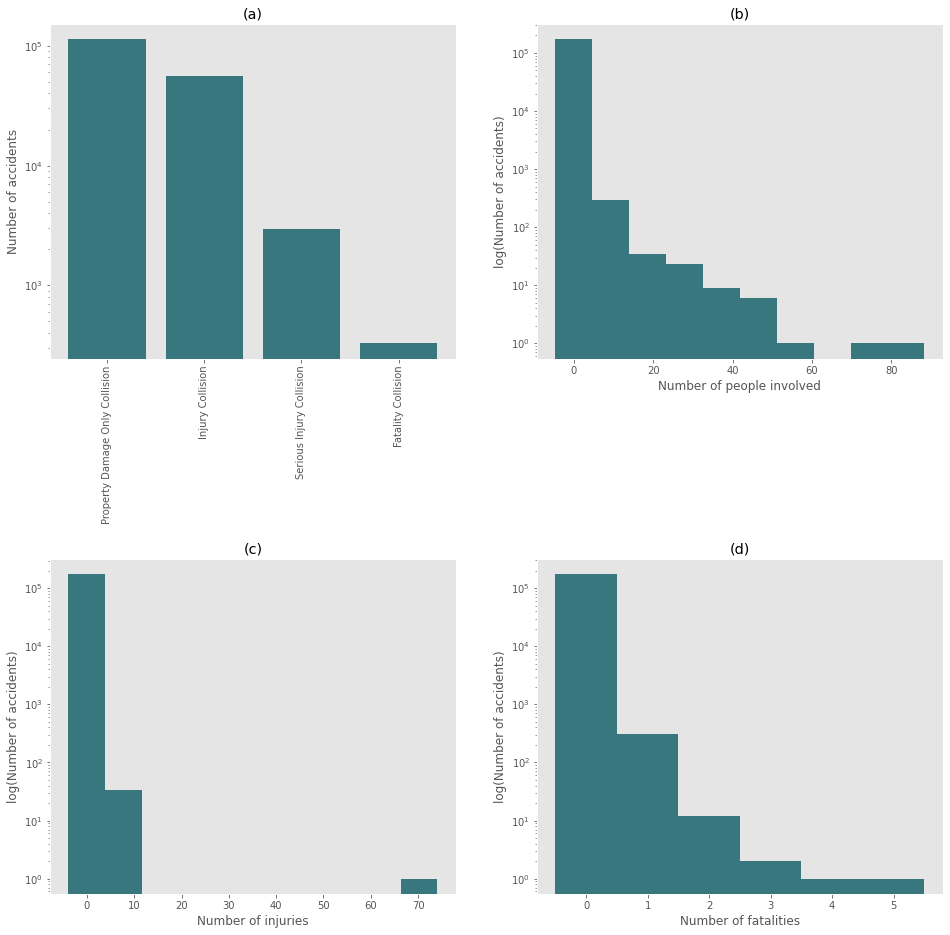

In [39]:
print("There are "+str(len(df))+" entries in df currently.")

#Create a 2x2 set of bar charts to describe the accident data
plt.rcParams["figure.figsize"] = (16,16)
#1 - Accident severities
plt.subplot(2,2,1)
freqs = Counter(df["SEVERITYDESC"])
xvals = range(len(freqs.values()))
plt.title("Distribution of accident outcomes")
plt.title('(a)')
plt.ylabel("Number of accidents")
plt.grid(b=None)
plt.bar(xvals, freqs.values() , color='#37777D')
plt.xticks(xvals, freqs.keys(), rotation='vertical')
plt.yscale('log')

#2 - Number of people involved
plt.subplot(2,2,2)
freqs = Counter(df["PERSONCOUNT"])
xvals = range(len(freqs.values()))
plt.title('(b)')
plt.xlabel("Number of people involved")
plt.ylabel("log(Number of accidents)")
plt.grid(b=None)
plt.hist(df["PERSONCOUNT"], align='left', color='#37777D')
plt.yscale('log')

#3 - Number of people involved
plt.subplot(2,2,3)
freqs = Counter(df["INJURIES"])
xvals = range(len(freqs.values()))
plt.title('(c)')
plt.xlabel("Number of injuries")
plt.ylabel("log(Number of accidents)")
plt.grid(b=None)
plt.hist(df["INJURIES"], align='left', color='#37777D')
plt.yscale('log')

#4 - Number of fatalities per accident
plt.subplot(2,2,4)
freqs = Counter(df["FATALITIES"])
xvals = range(len(freqs.values()))
plt.title('(d)')
plt.xlabel("Number of fatalities")
plt.ylabel("log(Number of accidents)")
plt.grid(b=None)
plt.hist(df["FATALITIES"], bins=[0,1,2,3,4,5,6], align='left', color='#37777D')
plt.yscale('log')

plt.subplots_adjust(hspace=0.6)
#plt.savefig('./FigZZZ_accident_histograms.png', bbox_inches='tight')

In [40]:
#Metadata for the charts that follow:
#1 - Weather conditions
print('Frequency of weather types:')
print(df["WEATHER"].value_counts())
print(len(df["WEATHER"]))

Frequency of weather types:
Clear                       110577
Raining                      32518
Overcast                     27274
Snowing                        837
Fog/Smog/Smoke                 547
Other                          255
Sleet/Hail/Freezing Rain       113
Blowing Sand/Dirt               44
Severe Crosswind                25
Partly Cloudy                   10
Blowing Snow                     1
Name: WEATHER, dtype: int64
172389


In [41]:
#2 - Road conditions
print('Frequency of rifferent road conditions:')
print(df["ROADCOND"].value_counts())

Frequency of rifferent road conditions:
Dry               123653
Wet                46375
Ice                 1095
Snow/Slush           847
Other                102
Standing Water        99
Sand/Mud/Dirt         60
Oil                   50
Name: ROADCOND, dtype: int64


In [42]:
#3 - Light conditions
print('Frequency of different light conditions:')
print(df["LIGHTCOND"].value_counts())

Frequency of different light conditions:
Daylight                    113914
Dark - Street Lights On      47357
Dusk                          5733
Dawn                          2450
Dark - No Street Lights       1381
Dark - Street Lights Off      1120
Other                          167
Dark - Unknown Lighting         22
Name: LIGHTCOND, dtype: int64


In [43]:
#4 - Month of year in which accident happens
print('Months of the year (there should be 12...)')
print(df["MONTH"].value_counts())

Months of the year (there should be 12...)
10    15442
6     15138
7     15022
5     15018
8     14721
1     14352
11    14305
3     14278
9     14132
4     14129
12    13207
2     12645
Name: MONTH, dtype: int64


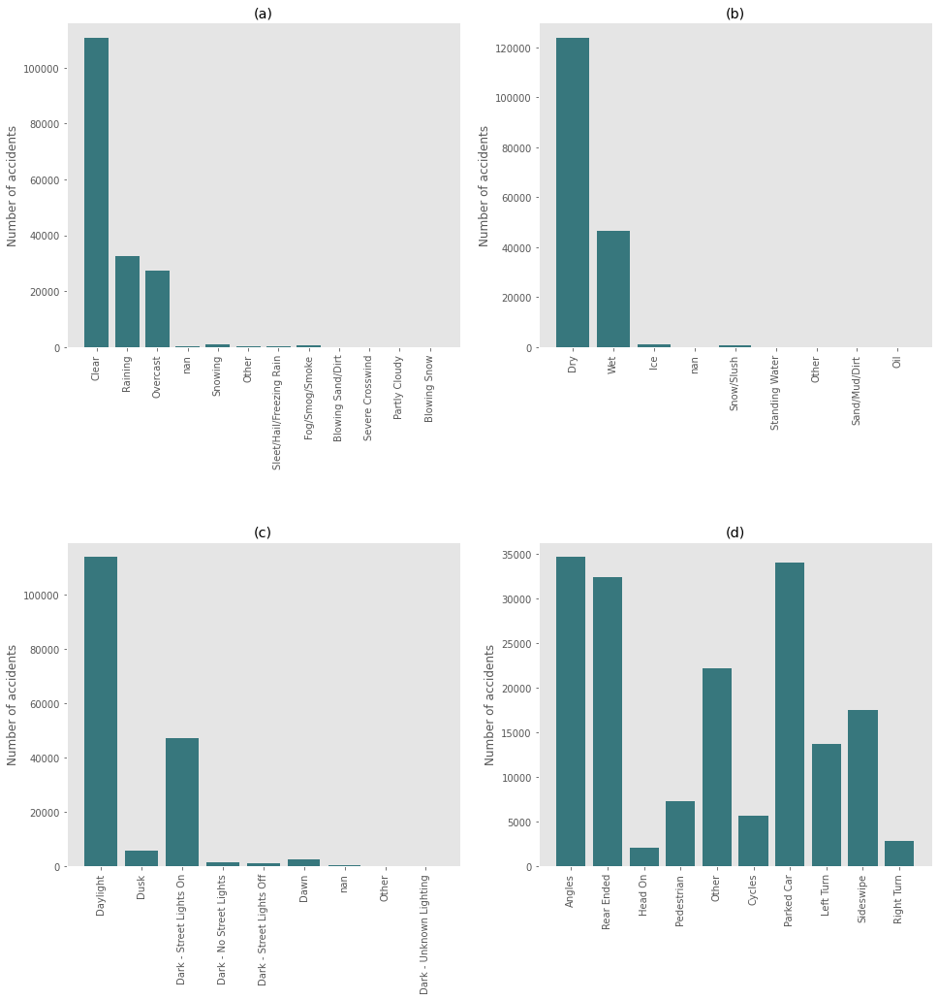

In [44]:
#Create a 2x2 set of bar charts to describe the accident data
plt.rcParams["figure.figsize"] = (16,16)
#1 - Weather conditions
plt.subplot(2,2,1)
freqs = Counter(df["WEATHER"])
xvals = range(len(freqs.values()))
plt.title('(a)')
plt.ylabel("Number of accidents")
plt.grid(b=None)
plt.bar(xvals, freqs.values() , color='#37777D')
plt.xticks(xvals, freqs.keys(), rotation='vertical')

#2 - Road conditions
plt.subplot(2,2,2)
freqs = Counter(df["ROADCOND"])
xvals = range(len(freqs.values()))
plt.title('(b)')
plt.ylabel("Number of accidents")
plt.grid(b=None)
plt.bar(xvals, freqs.values() , color='#37777D')
plt.xticks(xvals, freqs.keys(), rotation='vertical')

#3 - Light conditions
plt.subplot(2,2,3)
freqs = Counter(df["LIGHTCOND"])
xvals = range(len(freqs.values()))
plt.title('(c)')
plt.ylabel("Number of accidents")
plt.grid(b=None)
plt.bar(xvals, freqs.values() , color='#37777D')
plt.xticks(xvals, freqs.keys(), rotation='vertical')

#4 - ADDRTYPE
plt.subplot(2,2,4)
freqs = Counter(df["COLLISIONTYPE"])
xvals = range(len(freqs.values()))
plt.title('(d)')
plt.ylabel("Number of accidents")
plt.grid(b=None)
plt.bar(xvals, freqs.values() , color='#37777D')
plt.xticks(xvals, freqs.keys(), rotation='vertical')
plt.subplots_adjust(hspace=0.6)
#plt.savefig('./FigZZZ_accidents_by_roadcond.png', bbox_inches='tight')

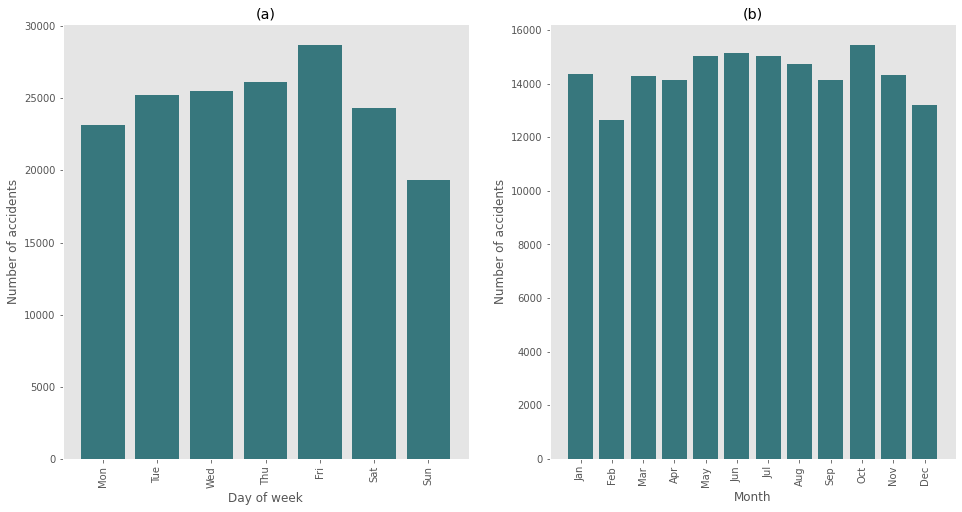

In [45]:
#Create a 2x2 set of bar charts to describe the accident data
plt.rcParams["figure.figsize"] = (16,8)

#1 - Day of week in which accident happens
plt.subplot(1,2,1)
freqs = Counter(df["DAY_OF_WEEK"])
xvals = range(len(freqs.values()))
#Order the days
ordered = dict(sorted(freqs.items()))
daynames = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
plt.title('(a)')
plt.xlabel("Day of week")
plt.ylabel("Number of accidents")
plt.grid(b=None)
plt.bar(xvals, ordered.values() , color='#37777D')
plt.xticks(xvals, daynames, rotation='vertical')

#2 - Month of year in which accident happens
plt.subplot(1,2,2)
freqs = Counter(df["MONTH"])
xvals = range(len(freqs.values()))
#Order the months
ordered = dict(sorted(freqs.items()))
monthnames = ['Jan','Feb','Mar','Apr','May', 'Jun','Jul','Aug','Sep','Oct','Nov','Dec']
plt.title('(b)')
plt.xlabel("Month")
plt.ylabel("Number of accidents")
plt.grid(b=None)
plt.bar(xvals, ordered.values() , color='#37777D')
plt.xticks(xvals, monthnames, rotation='vertical')
plt.subplots_adjust(hspace=0.6)
#plt.savefig('./FigZZZ_accidents_by_DOW_month.png', bbox_inches='tight')

In [46]:
#Count how many accidents occurred on each month since the beginning of the dataset

#Plot showing the number of accidents in each month since time began
#Set a monthrange between the first and last months in the dataframe:
monthssorted = sorted(df["INC_DATE_TIME"])
month_range = pd.period_range(start=monthssorted[0],end=monthssorted[-1],freq='M')
month_df = pd.DataFrame(month_range, columns=["YEAR_MONTH"])

#Index by time
new_df = pd.DataFrame(sorted(df["INC_DATE_TIME"]),columns=['INC_DATE_TIME'])
new_df["DATETIME"] = 0

def todatetime(time):
    output = time.to_pydatetime()
    return output.date()

from tqdm.auto import tqdm, trange
with concurrent.futures.ProcessPoolExecutor(num_processes) as pool:
    new_df["DATETIME"] = list(tqdm(pool.map(todatetime, new_df["INC_DATE_TIME"], chunksize=10), total=new_df.shape[0]))
new_df.set_index("DATETIME", inplace=True)

#Iterate over months and sum up the number of accidents in each
accidents_this_month = [0]*len(month_range)
accidents_this_month_daily = [0]*len(month_range)
days_in_month = np.zeros(len(month_range))
for i in range(0,len(month_range)):
    startdate = month_range[i].start_time.date()#.to_pydatetime()
    enddate = month_range[i].end_time.date()#.to_pydatetime()
    #Loop over the dataframe
    days_in_month[i] = month_range[i].days_in_month
    accidents_this_month[i] = len(new_df.loc[startdate:enddate]) 
    accidents_this_month_daily[i] = len(new_df.loc[startdate:enddate]) / days_in_month[i]
    
month_df["ACCIDENTS_THIS_MONTH"] = accidents_this_month
month_df["ACCIDENTS_THIS_MONTH_DAILY"] = accidents_this_month_daily
month_df["DAYS_IN_MONTH"] = days_in_month
month_df.head(15)

,YEAR_MONTH,ACCIDENTS_THIS_MONTH,ACCIDENTS_THIS_MONTH_DAILY,DAYS_IN_MONTH
0,2004-01,897,28.935484,31.0
1,2004-02,817,28.172414,29.0
2,2004-03,949,30.612903,31.0
3,2004-04,988,32.933333,30.0
4,2004-05,1075,34.677419,31.0
5,2004-06,1017,33.900000,30.0
6,2004-07,1010,32.580645,31.0
7,2004-08,1033,33.322581,31.0
8,2004-09,958,31.933333,30.0
9,2004-10,902,29.096774,31.0


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


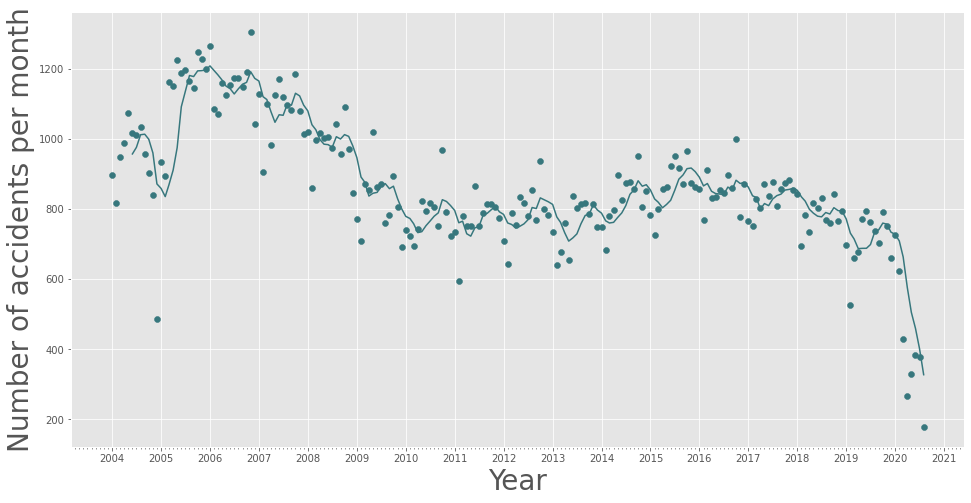

In [47]:
import matplotlib.dates as mdates

#Now plot the number of accidents for each month in the dataset
plt.rcParams["figure.figsize"] = (16,8)

#Convert Period to a fixed date for the start of each month
month_df["START_OF_MONTH"] = [0] * len(month_df)
for i in range(0,len(month_df)):
    month_df["START_OF_MONTH"][i] = month_df["YEAR_MONTH"][i].start_time.date()
    
#Get a three-month rolling average
month_df["SIX_MONTH_AVG"] = month_df.iloc[:,1].rolling(window=6).mean()

ax = plt.gca()
plt.rc('xtick',labelsize=10)
plt.rc('ytick',labelsize=10)
years = mdates.YearLocator()   
months = mdates.MonthLocator()
ax.xaxis.set_major_locator(years)
ax.xaxis.set_minor_locator(months)
plt.xlabel("Year", size=28)
plt.ylabel("Number of accidents per month", size=28)
plt.plot(month_df["START_OF_MONTH"], month_df["SIX_MONTH_AVG"], color='#37777D')
plt.scatter(month_df["START_OF_MONTH"], month_df["ACCIDENTS_THIS_MONTH"], color='#37777D')
plt.savefig('./Fig1_accidents_per_month.png', bbox_inches='tight')

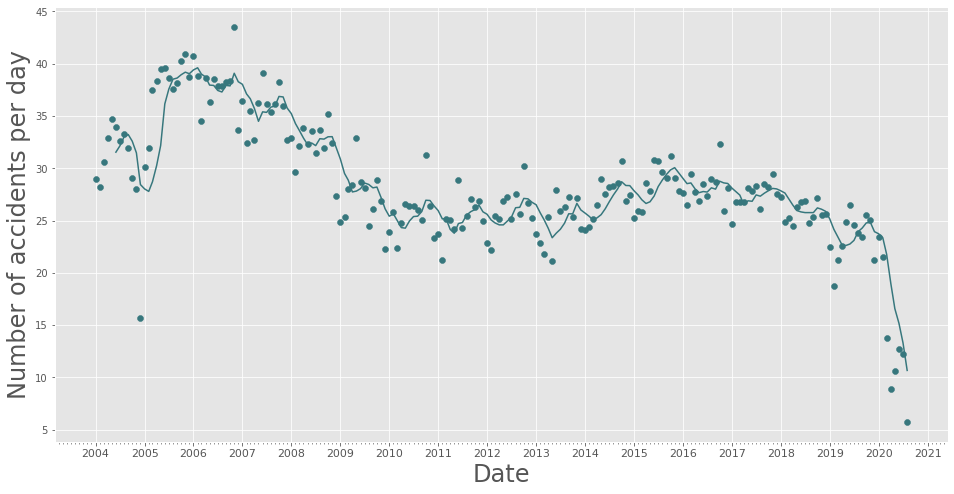

In [48]:
import matplotlib.dates as mdates

#Now plot the number of *daily* accidents for each month in the dataset
plt.rcParams["figure.figsize"] = (16,8)

#Get a three-month rolling average
month_df["SIX_MONTH_AVG_DAILY"] = month_df.iloc[:,2].rolling(window=6).mean()

plt.rc('xtick',labelsize=11)
plt.rc('ytick',labelsize=10)

ax = plt.gca()
years = mdates.YearLocator()   
months = mdates.MonthLocator()
ax.xaxis.set_major_locator(years)
ax.xaxis.set_minor_locator(months)
plt.xlabel("Date", size=24)
plt.ylabel("Number of accidents per day", size=24)
plt.plot(month_df["START_OF_MONTH"], month_df["SIX_MONTH_AVG_DAILY"], color='#37777D')
plt.scatter(month_df["START_OF_MONTH"], month_df["ACCIDENTS_THIS_MONTH_DAILY"], color='#37777D')
plt.savefig('./Fig5_daily_accidents_per_month.png', bbox_inches='tight')

### Results section where you discuss the results.


#### Pre-Processing: Feature extraction.
We now enter the final phase of data preparation -- deciding which of the remaining columns from the dataframe to include in our model building. Let's begin by looking at a correlation matrix for the dataset:

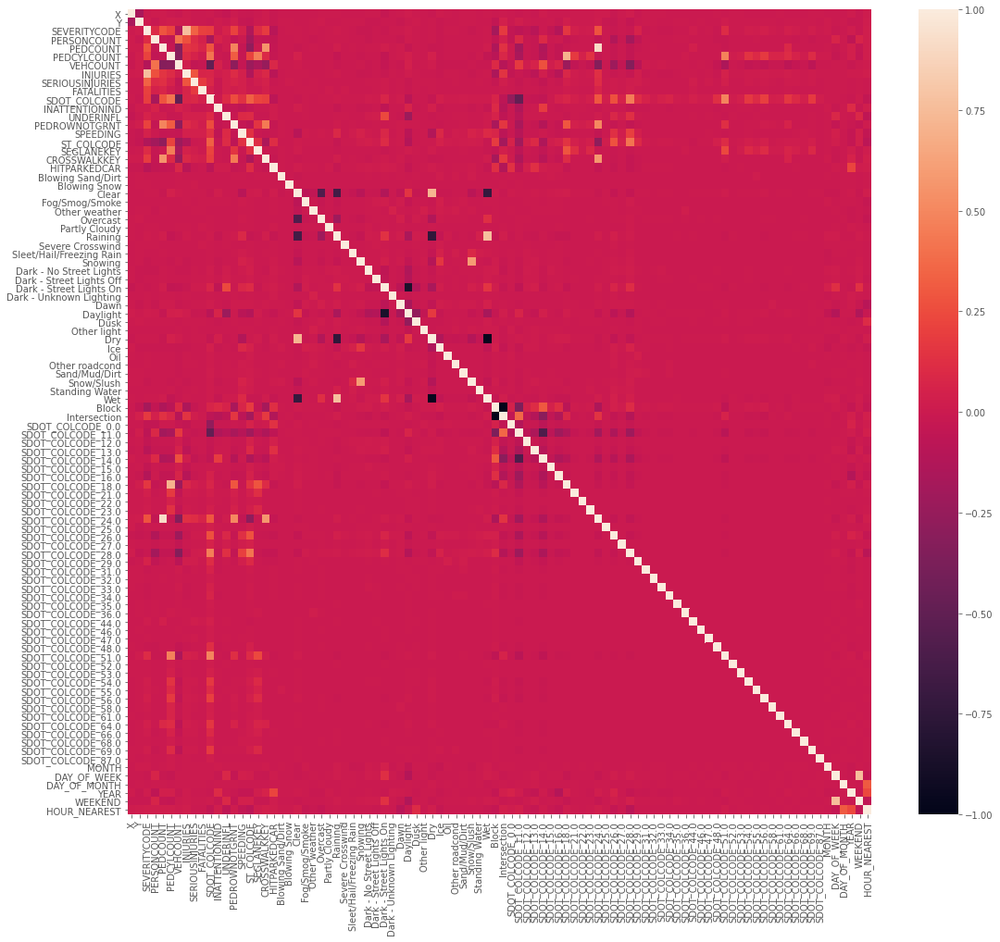

In [49]:
if "Alley" in data:
    del data["Alley"]

plt.rcParams["figure.figsize"] = (18,16)
corr = data.corr()
plt.rc('xtick',labelsize=10)
plt.rc('ytick',labelsize=10)
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns)
plt.savefig('./Fig3_correlation_unscaled.png', bbox_inches='tight')

Little is hugely surprising in here: there seem to be only weak/marginal correlations between SEVERITYCODE and weather/light conditions, however there are is also an interesting correlation between PEDROWNOTGRT and "Dark - Street Lights On". Presumably this is because in low light conditions drivers often don't see pedestrians?

It looks as if there is a correlation between SEVERITYCODE and _ST_COLCODE_ , which makes sense as we would expect different types of collision to have more serious consequences, e.g. a head-on collision on a motorway is likely to have more deaths/serious injuries than a low-speed read-end collision.

There are clear correlations between SEVERITYCODE and INJURIES , SERIOUSINJURIES and FATALITIES but these should surprise no-one as a combination of the latter three features defines SEVERITYCODE . The purpose of the model is to predict the SEVERITYCODE of an accident based on the environmental/geographical conditions. There is little point building a model that tells us "count the injuries, and if there are a lot then the accident is serious!". We will have to consider excluding these features from the dataset.

Deciding whether to keep or remove other features is a bit more subjective, however it is helpful to think of this from the point of view of an emergency services operator: an accident has occurred, and you wish to be able to make a quick prediction as to its severity. What key features might you expect to be able to know about before the first responders arrive at the scene in order to be able to influence who you send? Clearly you cannot know the number of fatalities in advance, but might the person reporting the accident be able to provide some useful information to help you predict the severity of the accident? It seems logical that the time, day, date, weather and road conditions would be known at the time of the accident. It is also likely that the person reporting the accident would be able to tell you if there were pedestrians/cyclists involved, and how many cars. They may also be able to tell you if alcohol is obviously a factor, if the accident took place on a pedestrian crossing/crosswalk, whether the accident involved a parked car and to provide a brief description of the nature of the collision (which is encoded in _SDOT_COLCODE_ ). We should therefore keep these features.

As a reminder, the target variable is SEVERITYCODE , so clearly this cannot be part of the feature set.

####Balancing the dataset
As is clear from the histogram of severity code shown above (and repeated below, using a linearly-scaled y axis), the vast majority of accidents involve either no injuries, or minor injuries only. Only a small number of accidents involve serious injuries or fatalities. If we train a classification model on these data, the model will be biased. To fix this issue we need to resample the data.

I propose to rebalance the data by:

1. Down-sampling SEVERITYCODE 1, 2 and 3 (no, minor and major injuries, respectively) to match the number of samples as is in SEVERITYCODE 4 (fatalities)
2. Converting SEVERITYCODE in to a binary variable with 0 for no/minor injuries and 1 for major injuries/fatalities.

In addition to balancing the dataset between the four values that can be taken by the target variable (SEVERITYCODE ) this will also drastically reduce overall size of the dataset, making it much more feasible for us to build and test our models.

In [50]:
data.dtypes

X                                  float64
Y                                  float64
SEVERITYCODE                         int64
PERSONCOUNT                          int64
PEDCOUNT                             int64
PEDCYLCOUNT                          int64
VEHCOUNT                             int64
INJURIES                             int64
SERIOUSINJURIES                      int64
FATALITIES                           int64
SDOT_COLCODE                       float64
INATTENTIONIND                       int64
UNDERINFL                            int64
WEATHER                             object
ROADCOND                            object
LIGHTCOND                           object
PEDROWNOTGRNT                        int64
SPEEDING                             int64
ST_COLCODE                           int64
ST_COLDESC                          object
SEGLANEKEY                           int64
CROSSWALKKEY                         int64
HITPARKEDCAR                         int64
Blowing San

In [51]:
#from imblearn.over_sampling import SMOTE
from sklearn.utils import resample

#Re-sample the dataset
shuffled_data = data.sample(frac=1, random_state=4)

#Create separate dataframes for each of the values of SEVERITYCODE
code_1 = shuffled_data.loc[shuffled_data["SEVERITYCODE"] == 1]
code_2 = shuffled_data.loc[shuffled_data["SEVERITYCODE"] == 2]
code_3 = shuffled_data.loc[shuffled_data["SEVERITYCODE"] == 3]
code_4 = shuffled_data.loc[shuffled_data["SEVERITYCODE"] == 4]

#Down-sample severity codes 1, 2 to match number of accidents in code 3
code_1_resample = shuffled_data.loc[shuffled_data["SEVERITYCODE"] == 1].sample(n=len(code_4), random_state=42)
code_2_resample = shuffled_data.loc[shuffled_data["SEVERITYCODE"] == 2].sample(n=len(code_4), random_state=42)
code_3_resample = shuffled_data.loc[shuffled_data["SEVERITYCODE"] == 3].sample(n=len(code_4), random_state=42)
code_4_resample = code_4

#Merge the dataframes
resampled_df = pd.concat([code_1_resample, code_2_resample, code_3_resample, code_4_resample])

#Now find out which of the resampled columns have no variation left in them 
#(e.g. rare weather conditions which are all "0" due to one-hot encoding and 
#re-sampling)
badcols = resampled_df.columns[resampled_df.nunique() <= 1]

#Remove these from DF
for badcol in badcols:
    if badcol in resampled_df:
        del resampled_df[badcol]
        
print(resampled_df.shape)

resampled_df.head(5)

(1312, 79)


,X,Y,SEVERITYCODE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INJURIES,SERIOUSINJURIES,FATALITIES,SDOT_COLCODE,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR,Clear,Fog/Smog/Smoke,Other weather,Overcast,Partly Cloudy,Raining,Severe Crosswind,Sleet/Hail/Freezing Rain,Snowing,Dark - No Street Lights,Dark - Street Lights Off,Dark - Street Lights On,Dawn,Daylight,Dusk,Dry,Ice,Sand/Mud/Dirt,Snow/Slush,Standing Water,Wet,Block,Intersection,SDOT_COLCODE_0.0,SDOT_COLCODE_11.0,SDOT_COLCODE_12.0,SDOT_COLCODE_13.0,SDOT_COLCODE_14.0,SDOT_COLCODE_15.0,SDOT_COLCODE_16.0,SDOT_COLCODE_18.0,SDOT_COLCODE_21.0,SDOT_COLCODE_24.0,SDOT_COLCODE_25.0,SDOT_COLCODE_26.0,SDOT_COLCODE_27.0,SDOT_COLCODE_28.0,SDOT_COLCODE_29.0,SDOT_COLCODE_31.0,SDOT_COLCODE_34.0,SDOT_COLCODE_44.0,SDOT_COLCODE_51.0,SDOT_COLCODE_54.0,SDOT_COLCODE_56.0,SDOT_COLCODE_61.0,SDOT_COLCODE_64.0,INC_DATE_TIME,MONTH,DAY_OF_WEEK,DAY_OF_MONTH,YEAR,DAY_STRING,MONTH_STRING,WEEKEND,HOUR_NEAREST,NEIGHBOURHOOD
26442,-122.276741,47.547432,1,2,0,0,2,0,0,0,14.0,0,0,Clear,Dry,Daylight,0,0,14,From same direction - both going straight - on...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2006-07-16 12:31:00,7,6,16,2006,Sun,Jul,1,13,Columbia City
158232,-122.309895,47.550585,1,3,0,0,3,0,0,0,16.0,0,0,Clear,Dry,Daylight,0,0,12,From same direction - both going straight - on...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2019-10-02 12:15:00,10,2,2,2019,Wed,Oct,0,12,Mid-Beacon Hill
106188,-122.356727,47.698747,1,1,0,0,1,0,0,0,28.0,0,0,Overcast,Dry,Daylight,0,1,50,Fixed object,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2013-07-11 18:23:00,7,3,11,2013,Thu,Jul,0,18,Greenwood
101269,-122.317852,47.708561,1,2,0,0,2,0,0,0,11.0,0,0,Overcast,Wet,Dark - Street Lights On,0,0,11,From same direction - both going straight - bo...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2012-06-09 01:40:00,6,5,9,2012,Sat,Jun,1,2,Pinehurst
136546,-122.306328,47.606668,1,2,0,0,2,0,0,0,14.0,1,0,Clear,Dry,Daylight,0,0,11,From same direction - both going straight - bo...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2016-06-10 07:39:00,6,4,10,2016,Fri,Jun,0,8,Minor


In [52]:
for column in resampled_df.columns:
    print(column)

X
Y
SEVERITYCODE
PERSONCOUNT
PEDCOUNT
PEDCYLCOUNT
VEHCOUNT
INJURIES
SERIOUSINJURIES
FATALITIES
SDOT_COLCODE
INATTENTIONIND
UNDERINFL
WEATHER
ROADCOND
LIGHTCOND
PEDROWNOTGRNT
SPEEDING
ST_COLCODE
ST_COLDESC
SEGLANEKEY
CROSSWALKKEY
HITPARKEDCAR
Clear
Fog/Smog/Smoke
Other weather
Overcast
Partly Cloudy
Raining
Severe Crosswind
Sleet/Hail/Freezing Rain
Snowing
Dark - No Street Lights
Dark - Street Lights Off
Dark - Street Lights On
Dawn
Daylight
Dusk
Dry
Ice
Sand/Mud/Dirt
Snow/Slush
Standing Water
Wet
Block
Intersection
SDOT_COLCODE_0.0
SDOT_COLCODE_11.0
SDOT_COLCODE_12.0
SDOT_COLCODE_13.0
SDOT_COLCODE_14.0
SDOT_COLCODE_15.0
SDOT_COLCODE_16.0
SDOT_COLCODE_18.0
SDOT_COLCODE_21.0
SDOT_COLCODE_24.0
SDOT_COLCODE_25.0
SDOT_COLCODE_26.0
SDOT_COLCODE_27.0
SDOT_COLCODE_28.0
SDOT_COLCODE_29.0
SDOT_COLCODE_31.0
SDOT_COLCODE_34.0
SDOT_COLCODE_44.0
SDOT_COLCODE_51.0
SDOT_COLCODE_54.0
SDOT_COLCODE_56.0
SDOT_COLCODE_61.0
SDOT_COLCODE_64.0
INC_DATE_TIME
MONTH
DAY_OF_WEEK
DAY_OF_MONTH
YEAR
DAY_STRING
MONTH

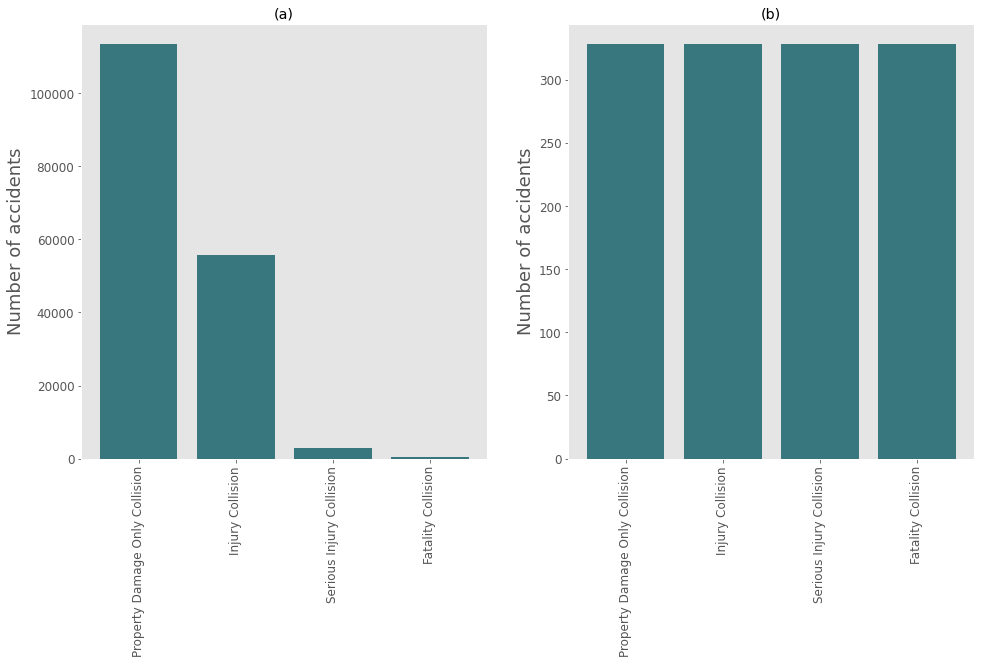

In [53]:
plt.rc('xtick',labelsize=12)
plt.rc('ytick',labelsize=12)

#Accident outcomes before/after
plt.rcParams["figure.figsize"] = (16,8)

#1 - Accident severities (original)
plt.subplot(1,2,1)
freqs = Counter(df["SEVERITYDESC"])
xvals = range(len(freqs.values()))
plt.title('(a)')
plt.ylabel("Number of accidents", size=18)
plt.grid(b=None)
plt.bar(xvals, freqs.values() , color='#37777D')
plt.xticks(xvals, freqs.keys(), rotation='vertical')

#2 - Accident severities (normalised)
plt.subplot(1,2,2)
freqs = Counter(resampled_df["SEVERITYCODE"])
xvals = range(len(freqs.values()))
labels = ['Property Damage Only Collision', 'Injury Collision', 'Serious Injury Collision', 'Fatality Collision']
plt.title('(b)')
plt.ylabel("Number of accidents", size=18)
plt.grid(b=None)
plt.bar(xvals, freqs.values() , color='#37777D')
plt.xticks(xvals, labels, rotation='vertical')
plt.savefig('./Fig4_accident_severitycode_unscaled_scaled.png', bbox_inches='tight')

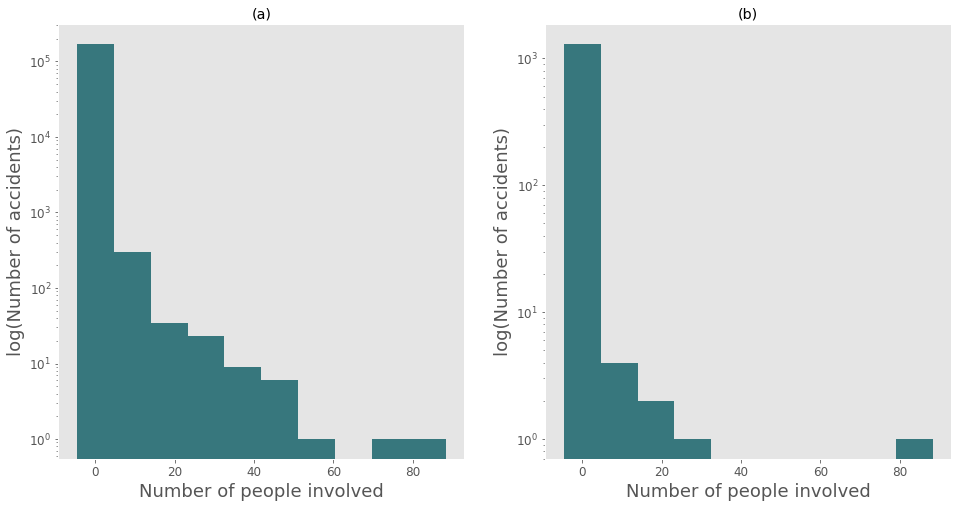

In [54]:
#People involved before/after
plt.rcParams["figure.figsize"] = (16,8)

#1 - People involved (original)
plt.subplot(1,2,1)
freqs = Counter(df["PERSONCOUNT"])
xvals = range(len(freqs.values()))
plt.title('(a)')
plt.xlabel("Number of people involved", size=18)
plt.ylabel("log(Number of accidents)", size=18)
plt.grid(b=None)
plt.hist(df["PERSONCOUNT"], align='left', color='#37777D')
plt.yscale('log')

#2 - People involved (re-sampled)
plt.subplot(1,2,2)
freqs = Counter(resampled_df["PERSONCOUNT"])
xvals = range(len(freqs.values()))
plt.title('(b)')
plt.xlabel("Number of people involved", size=18)
plt.ylabel("log(Number of accidents)", size=18)
plt.grid(b=None)
plt.hist(resampled_df["PERSONCOUNT"], align='left', color='#37777D')
plt.yscale('log')
plt.savefig('./Fig5_personcount_before_after.png', bbox_inches='tight')

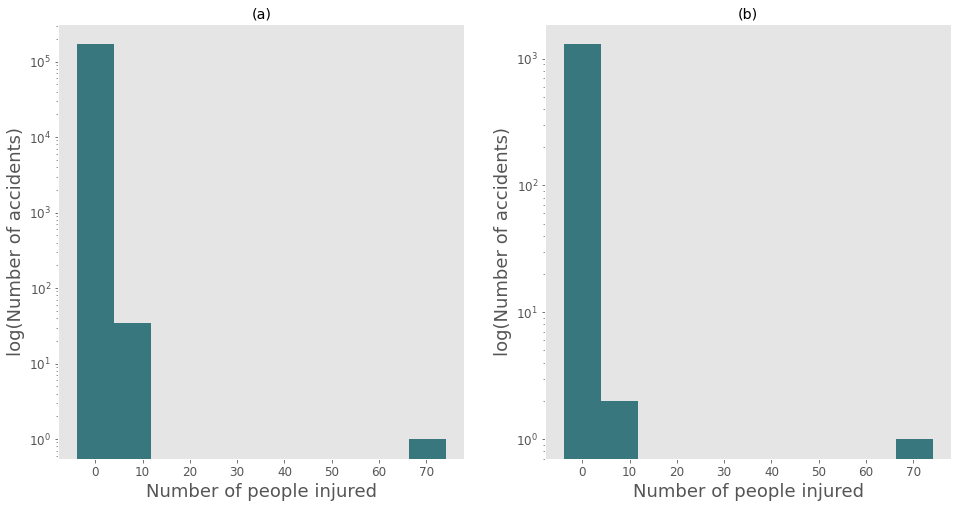

In [55]:
#People involved before/after
plt.rcParams["figure.figsize"] = (16,8)

#1 - Injuries (original)
plt.subplot(1,2,1)
freqs = Counter(df["INJURIES"])
xvals = range(len(freqs.values()))
plt.title('(a)')
plt.xlabel("Number of people injured", size=18)
plt.ylabel("log(Number of accidents)", size=18)
plt.grid(b=None)
plt.hist(df["INJURIES"], align='left', color='#37777D')
plt.yscale('log')

#2 - People injured (re-sampled)
plt.subplot(1,2,2)
freqs = Counter(resampled_df["INJURIES"])
xvals = range(len(freqs.values()))
plt.title('(b)')
plt.xlabel("Number of people injured", size=18)
plt.ylabel("log(Number of accidents)", size=18)
plt.grid(b=None)
plt.hist(resampled_df["INJURIES"], align='left', color='#37777D')
plt.yscale('log')
plt.savefig('./Fig6_injuries_before_after.png', bbox_inches='tight')

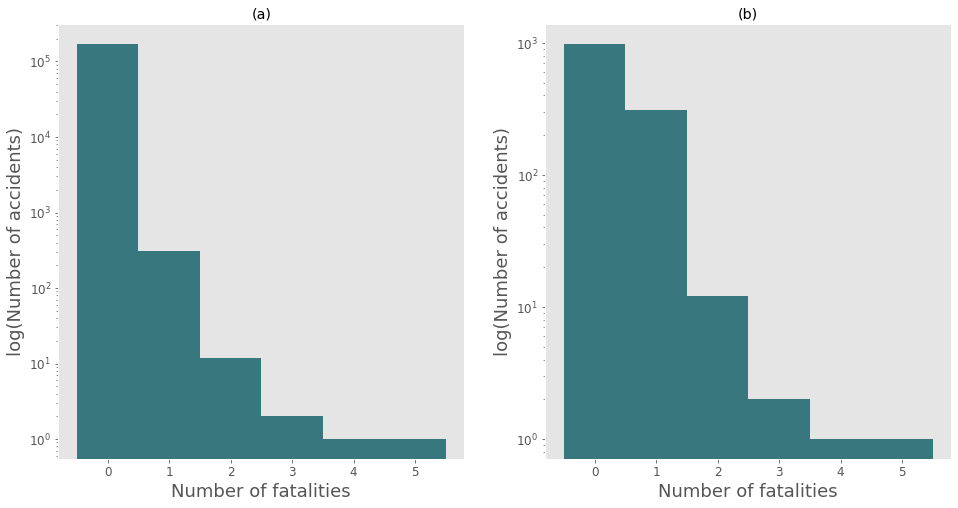

In [56]:
#People involved before/after
plt.rcParams["figure.figsize"] = (16,8)

#1 - People killed (original)
plt.subplot(1,2,1)
freqs = Counter(df["FATALITIES"])
xvals = range(len(freqs.values()))
plt.title('(a)')
plt.xlabel("Number of fatalities", size=18)
plt.ylabel("log(Number of accidents)", size=18)
plt.grid(b=None)
plt.hist(df["FATALITIES"], align='left', color='#37777D', bins=[0,1,2,3,4,5,6])
plt.yscale('log')

#2 - People killed (re-sampled)
plt.subplot(1,2,2)
freqs = Counter(resampled_df["FATALITIES"])
xvals = range(len(freqs.values()))
plt.title('(b)')
plt.xlabel("Number of fatalities", size=18)
plt.ylabel("log(Number of accidents)", size=18)
plt.grid(b=None)
plt.hist(resampled_df["FATALITIES"], align='left', color='#37777D', bins=[0,1,2,3,4,5,6])
plt.yscale('log')
plt.savefig('./Fig7_fatalities_before_after.png', bbox_inches='tight')

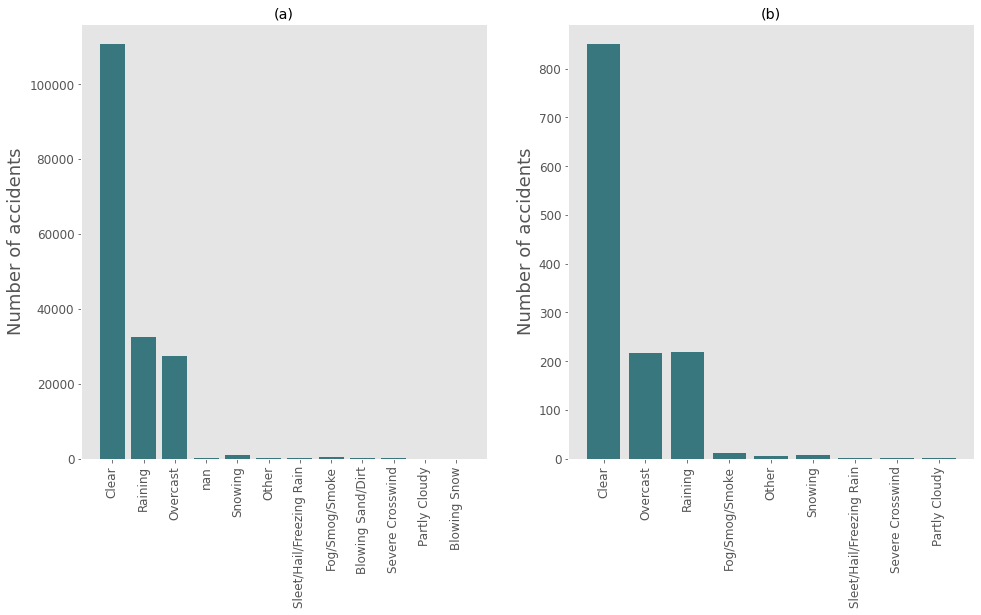

In [57]:
#Weather before/after
plt.rcParams["figure.figsize"] = (16,8)

#1 - Weather (original)
plt.subplot(1,2,1)
freqs = Counter(df["WEATHER"])
xvals = range(len(freqs.values()))
plt.title('(a)')
plt.ylabel("Number of accidents", size=18)
plt.grid(b=None)
plt.bar(xvals, freqs.values() , color='#37777D')
plt.xticks(xvals, freqs.keys(), rotation='vertical')

#2 - Weather (normalised)
plt.subplot(1,2,2)
freqs = Counter(resampled_df["WEATHER"])
xvals = range(len(freqs.values()))
#labels = ['Property Damage/Minor Injury', 'Serious Injury/Fatality Collision']
plt.title('(b)')
plt.ylabel("Number of accidents", size=18)
plt.grid(b=None)
plt.bar(xvals, freqs.values() , color='#37777D')
plt.xticks(xvals, freqs.keys(), rotation='vertical')
plt.savefig('./Fig8_weather_unscaled_scaled.png', bbox_inches='tight')

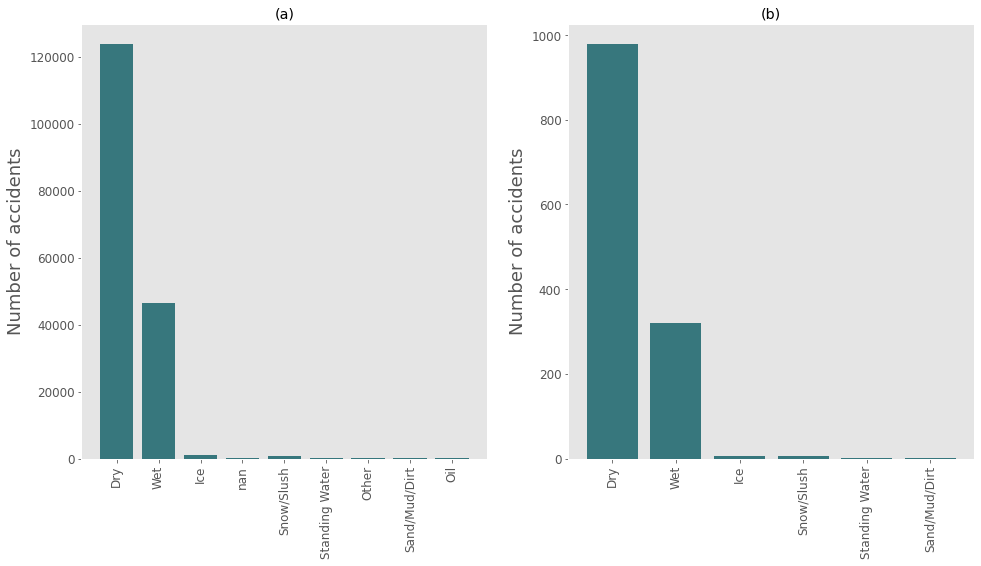

In [58]:
#Roadcond before/after
plt.rcParams["figure.figsize"] = (16,8)

#1 - Road Conditions (original)
plt.subplot(1,2,1)
freqs = Counter(df["ROADCOND"])
xvals = range(len(freqs.values()))
plt.title('(a)')
plt.ylabel("Number of accidents", size=18)
plt.grid(b=None)
plt.bar(xvals, freqs.values() , color='#37777D')
plt.xticks(xvals, freqs.keys(), rotation='vertical')

#2 - Road Conditions (normalised)
plt.subplot(1,2,2)
freqs = Counter(resampled_df["ROADCOND"])
xvals = range(len(freqs.values()))
#labels = ['Property Damage/Minor Injury', 'Serious Injury/Fatality Collision']
plt.title('(b)')
plt.ylabel("Number of accidents", size=18)
plt.grid(b=None)
plt.bar(xvals, freqs.values() , color='#37777D')
plt.xticks(xvals, freqs.keys(), rotation='vertical')
plt.savefig('./Fig9_roadcond_unscaled_scaled.png', bbox_inches='tight')

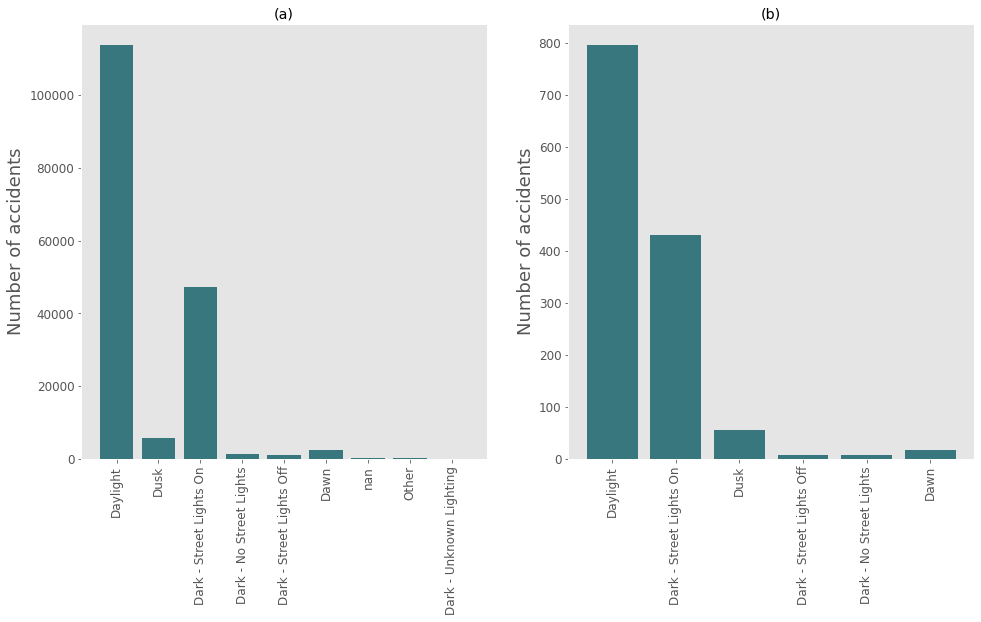

In [59]:
#Light before/after
plt.rcParams["figure.figsize"] = (16,8)

#1 - Light Conditions (original)
plt.subplot(1,2,1)
freqs = Counter(df["LIGHTCOND"])
xvals = range(len(freqs.values()))
plt.title('(a)')
plt.ylabel("Number of accidents", size=18)
plt.grid(b=None)
plt.bar(xvals, freqs.values() , color='#37777D')
plt.xticks(xvals, freqs.keys(), rotation='vertical')

#2 - Light Conditions (normalised)
plt.subplot(1,2,2)
freqs = Counter(resampled_df["LIGHTCOND"])
xvals = range(len(freqs.values()))
plt.title('(b)')
plt.ylabel("Number of accidents", size=18)
plt.grid(b=None)
plt.bar(xvals, freqs.values() , color='#37777D')
plt.xticks(xvals, freqs.keys(), rotation='vertical')
plt.savefig('./Fig10_lightcond_unscaled_scaled.png', bbox_inches='tight')

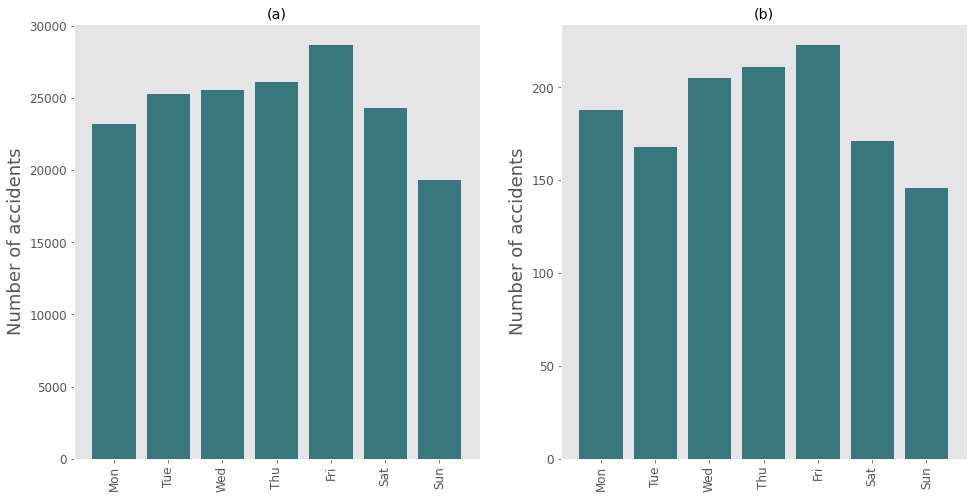

In [60]:
#Day of week (Before/After)
plt.rcParams["figure.figsize"] = (16,8)

#1 - Day of week (before)
plt.subplot(1,2,1)
freqs = Counter(df["DAY_OF_WEEK"])
xvals = range(len(freqs.values()))
#Order the days
ordered = dict(sorted(freqs.items()))
daynames = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
plt.title('(a)')
#plt.xlabel("Day of week", size=18)
plt.ylabel("Number of accidents", size=18)
plt.grid(b=None)
plt.bar(xvals, ordered.values() , color='#37777D')
plt.xticks(xvals, daynames, rotation='vertical')

#2 - Day of week (after)
plt.subplot(1,2,2)
freqs = Counter(resampled_df["DAY_OF_WEEK"])
xvals = range(len(freqs.values()))
#Order the days
ordered = dict(sorted(freqs.items()))
daynames = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
plt.title('(b)')
#plt.xlabel("Day of week", size=18)
plt.ylabel("Number of accidents", size=18)
plt.grid(b=None)
plt.bar(xvals, ordered.values() , color='#37777D')
plt.xticks(xvals, daynames, rotation='vertical')
plt.savefig('./Fig11_DOW_unscaled_scaled.png', bbox_inches='tight')

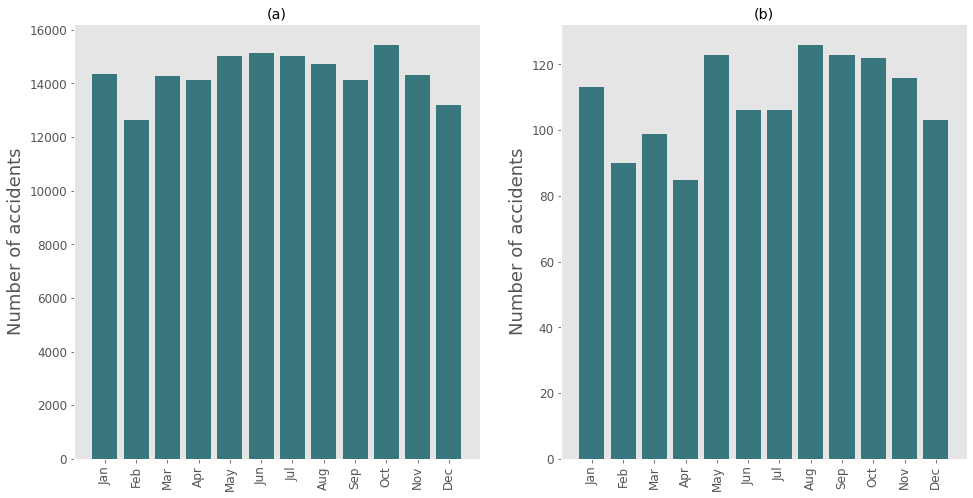

In [61]:
#Month of year (Before/After)
plt.rcParams["figure.figsize"] = (16,8)

#1 - Month of year in which accident happens
plt.subplot(1,2,1)
freqs = Counter(df["MONTH"])
xvals = range(len(freqs.values()))
#Order the months
ordered = dict(sorted(freqs.items()))
monthnames = ['Jan','Feb','Mar','Apr','May', 'Jun','Jul','Aug','Sep','Oct','Nov','Dec']
plt.title('(a)')
#plt.xlabel("Month")
plt.ylabel("Number of accidents", size=18)
plt.grid(b=None)
plt.bar(xvals, ordered.values() , color='#37777D')
plt.xticks(xvals, monthnames, rotation='vertical')
plt.subplots_adjust(hspace=0.6)

#1 - Month of year in which accident happens
plt.subplot(1,2,2)
freqs = Counter(resampled_df["MONTH"])
xvals = range(len(freqs.values()))
#Order the months
ordered = dict(sorted(freqs.items()))
monthnames = ['Jan','Feb','Mar','Apr','May', 'Jun','Jul','Aug','Sep','Oct','Nov','Dec']
plt.title('(b)')
#plt.xlabel("Month")
plt.ylabel("Number of accidents", size=18)
plt.grid(b=None)
plt.bar(xvals, ordered.values() , color='#37777D')
plt.xticks(xvals, monthnames, rotation='vertical')
plt.subplots_adjust(hspace=0.6)
plt.savefig('./Fig12_months_unscaled_scaled.png', bbox_inches='tight')

In [62]:
resampled_df.head(5)

,X,Y,SEVERITYCODE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INJURIES,SERIOUSINJURIES,FATALITIES,SDOT_COLCODE,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR,Clear,Fog/Smog/Smoke,Other weather,Overcast,Partly Cloudy,Raining,Severe Crosswind,Sleet/Hail/Freezing Rain,Snowing,Dark - No Street Lights,Dark - Street Lights Off,Dark - Street Lights On,Dawn,Daylight,Dusk,Dry,Ice,Sand/Mud/Dirt,Snow/Slush,Standing Water,Wet,Block,Intersection,SDOT_COLCODE_0.0,SDOT_COLCODE_11.0,SDOT_COLCODE_12.0,SDOT_COLCODE_13.0,SDOT_COLCODE_14.0,SDOT_COLCODE_15.0,SDOT_COLCODE_16.0,SDOT_COLCODE_18.0,SDOT_COLCODE_21.0,SDOT_COLCODE_24.0,SDOT_COLCODE_25.0,SDOT_COLCODE_26.0,SDOT_COLCODE_27.0,SDOT_COLCODE_28.0,SDOT_COLCODE_29.0,SDOT_COLCODE_31.0,SDOT_COLCODE_34.0,SDOT_COLCODE_44.0,SDOT_COLCODE_51.0,SDOT_COLCODE_54.0,SDOT_COLCODE_56.0,SDOT_COLCODE_61.0,SDOT_COLCODE_64.0,INC_DATE_TIME,MONTH,DAY_OF_WEEK,DAY_OF_MONTH,YEAR,DAY_STRING,MONTH_STRING,WEEKEND,HOUR_NEAREST,NEIGHBOURHOOD
26442,-122.276741,47.547432,1,2,0,0,2,0,0,0,14.0,0,0,Clear,Dry,Daylight,0,0,14,From same direction - both going straight - on...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2006-07-16 12:31:00,7,6,16,2006,Sun,Jul,1,13,Columbia City
158232,-122.309895,47.550585,1,3,0,0,3,0,0,0,16.0,0,0,Clear,Dry,Daylight,0,0,12,From same direction - both going straight - on...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2019-10-02 12:15:00,10,2,2,2019,Wed,Oct,0,12,Mid-Beacon Hill
106188,-122.356727,47.698747,1,1,0,0,1,0,0,0,28.0,0,0,Overcast,Dry,Daylight,0,1,50,Fixed object,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2013-07-11 18:23:00,7,3,11,2013,Thu,Jul,0,18,Greenwood
101269,-122.317852,47.708561,1,2,0,0,2,0,0,0,11.0,0,0,Overcast,Wet,Dark - Street Lights On,0,0,11,From same direction - both going straight - bo...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2012-06-09 01:40:00,6,5,9,2012,Sat,Jun,1,2,Pinehurst
136546,-122.306328,47.606668,1,2,0,0,2,0,0,0,14.0,1,0,Clear,Dry,Daylight,0,0,11,From same direction - both going straight - bo...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2016-06-10 07:39:00,6,4,10,2016,Fri,Jun,0,8,Minor


In [63]:
resampled_df.shape

(1312, 79)

In [64]:
resampled_df.dtypes

X                                  float64
Y                                  float64
SEVERITYCODE                         int64
PERSONCOUNT                          int64
PEDCOUNT                             int64
PEDCYLCOUNT                          int64
VEHCOUNT                             int64
INJURIES                             int64
SERIOUSINJURIES                      int64
FATALITIES                           int64
SDOT_COLCODE                       float64
INATTENTIONIND                       int64
UNDERINFL                            int64
WEATHER                             object
ROADCOND                            object
LIGHTCOND                           object
PEDROWNOTGRNT                        int64
SPEEDING                             int64
ST_COLCODE                           int64
ST_COLDESC                          object
SEGLANEKEY                           int64
CROSSWALKKEY                         int64
HITPARKEDCAR                         int64
Clear      

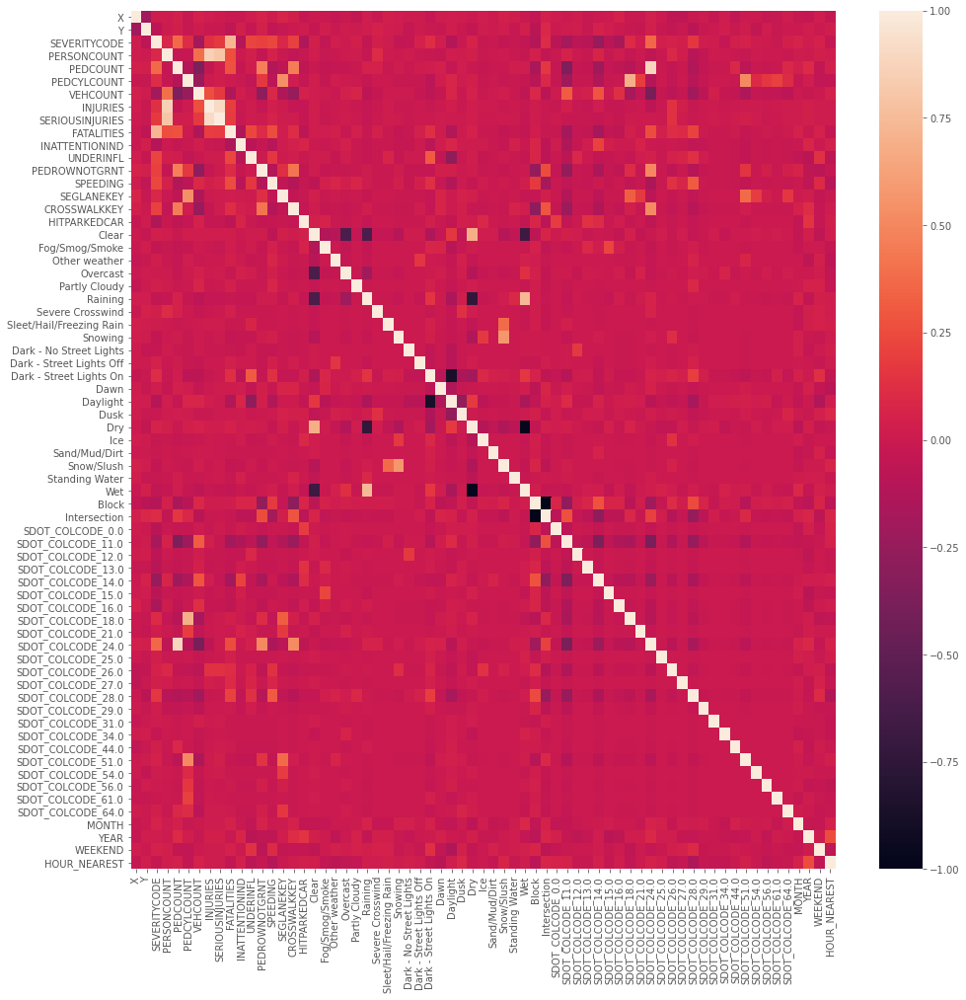

In [65]:
#Now let's look at the correlation matrix anew:
plt.rcParams["figure.figsize"] = (16,16)
corr = resampled_df.drop(["NEIGHBOURHOOD", "DAY_OF_WEEK", "DAY_OF_MONTH", "ST_COLCODE", "SDOT_COLCODE"], axis=1).corr()
#print(corr)
plt.rc('xtick',labelsize=10)
plt.rc('ytick',labelsize=10)
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns)
plt.savefig('./Fig13_correlation_resampled.png', bbox_inches='tight')

def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df, n=5):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

In [66]:
#List the features that are remaining in resample_df
print("Column names:")
for (columnName, columnData) in resampled_df.iteritems():
    print(columnName)

Column names:
X
Y
SEVERITYCODE
PERSONCOUNT
PEDCOUNT
PEDCYLCOUNT
VEHCOUNT
INJURIES
SERIOUSINJURIES
FATALITIES
SDOT_COLCODE
INATTENTIONIND
UNDERINFL
WEATHER
ROADCOND
LIGHTCOND
PEDROWNOTGRNT
SPEEDING
ST_COLCODE
ST_COLDESC
SEGLANEKEY
CROSSWALKKEY
HITPARKEDCAR
Clear
Fog/Smog/Smoke
Other weather
Overcast
Partly Cloudy
Raining
Severe Crosswind
Sleet/Hail/Freezing Rain
Snowing
Dark - No Street Lights
Dark - Street Lights Off
Dark - Street Lights On
Dawn
Daylight
Dusk
Dry
Ice
Sand/Mud/Dirt
Snow/Slush
Standing Water
Wet
Block
Intersection
SDOT_COLCODE_0.0
SDOT_COLCODE_11.0
SDOT_COLCODE_12.0
SDOT_COLCODE_13.0
SDOT_COLCODE_14.0
SDOT_COLCODE_15.0
SDOT_COLCODE_16.0
SDOT_COLCODE_18.0
SDOT_COLCODE_21.0
SDOT_COLCODE_24.0
SDOT_COLCODE_25.0
SDOT_COLCODE_26.0
SDOT_COLCODE_27.0
SDOT_COLCODE_28.0
SDOT_COLCODE_29.0
SDOT_COLCODE_31.0
SDOT_COLCODE_34.0
SDOT_COLCODE_44.0
SDOT_COLCODE_51.0
SDOT_COLCODE_54.0
SDOT_COLCODE_56.0
SDOT_COLCODE_61.0
SDOT_COLCODE_64.0
INC_DATE_TIME
MONTH
DAY_OF_WEEK
DAY_OF_MONTH
YEAR
DA

In [67]:
Feature = resampled_df.drop(["SEVERITYCODE","INJURIES","SERIOUSINJURIES","FATALITIES", "SEGLANEKEY", "CROSSWALKKEY", "YEAR", "NEIGHBOURHOOD", "DAY_STRING", "MONTH_STRING", "WEATHER", "ROADCOND", "LIGHTCOND", "INC_DATE_TIME", "ST_COLDESC", "PERSONCOUNT", "SDOT_COLCODE", "ST_COLCODE", "HITPARKEDCAR", "DAY_OF_WEEK", "DAY_OF_MONTH"], axis=1)
Feature.head(5)

,X,Y,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INATTENTIONIND,UNDERINFL,PEDROWNOTGRNT,SPEEDING,Clear,Fog/Smog/Smoke,Other weather,Overcast,Partly Cloudy,Raining,Severe Crosswind,Sleet/Hail/Freezing Rain,Snowing,Dark - No Street Lights,Dark - Street Lights Off,Dark - Street Lights On,Dawn,Daylight,Dusk,Dry,Ice,Sand/Mud/Dirt,Snow/Slush,Standing Water,Wet,Block,Intersection,SDOT_COLCODE_0.0,SDOT_COLCODE_11.0,SDOT_COLCODE_12.0,SDOT_COLCODE_13.0,SDOT_COLCODE_14.0,SDOT_COLCODE_15.0,SDOT_COLCODE_16.0,SDOT_COLCODE_18.0,SDOT_COLCODE_21.0,SDOT_COLCODE_24.0,SDOT_COLCODE_25.0,SDOT_COLCODE_26.0,SDOT_COLCODE_27.0,SDOT_COLCODE_28.0,SDOT_COLCODE_29.0,SDOT_COLCODE_31.0,SDOT_COLCODE_34.0,SDOT_COLCODE_44.0,SDOT_COLCODE_51.0,SDOT_COLCODE_54.0,SDOT_COLCODE_56.0,SDOT_COLCODE_61.0,SDOT_COLCODE_64.0,MONTH,WEEKEND,HOUR_NEAREST
26442,-122.276741,47.547432,0,0,2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,1,13
158232,-122.309895,47.550585,0,0,3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,12
106188,-122.356727,47.698747,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,7,0,18
101269,-122.317852,47.708561,0,0,2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,1,2
136546,-122.306328,47.606668,0,0,2,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,0,8


In [68]:
#Do a final check for null values before we begin scaling the dataset
print(Feature.isnull().sum(axis=0))

X                           0
Y                           0
PEDCOUNT                    0
PEDCYLCOUNT                 0
VEHCOUNT                    0
INATTENTIONIND              0
UNDERINFL                   0
PEDROWNOTGRNT               0
SPEEDING                    0
Clear                       0
Fog/Smog/Smoke              0
Other weather               0
Overcast                    0
Partly Cloudy               0
Raining                     0
Severe Crosswind            0
Sleet/Hail/Freezing Rain    0
Snowing                     0
Dark - No Street Lights     0
Dark - Street Lights Off    0
Dark - Street Lights On     0
Dawn                        0
Daylight                    0
Dusk                        0
Dry                         0
Ice                         0
Sand/Mud/Dirt               0
Snow/Slush                  0
Standing Water              0
Wet                         0
Block                       0
Intersection                0
SDOT_COLCODE_0.0            0
SDOT_COLCO

In [69]:
print("Shape of Feature dataframe:")
print(Feature.shape)
#Feature.dtypes
#print("Column names:")
#for (columnName, columnData) in Feature.iteritems():
#    print(columnName)

Shape of Feature dataframe:
(1312, 58)


### Discussion section where you discuss any observations you noted and any recommendations you can make based on the results.

####Model Development and Evaluation
In order to develop a model for predicting accident severity, the re-sampled, cleaned dataset was split in to testing and training sub-samples (containing 30% and 70% of the samples, respectively) using the scikit learn “train_test_split” method. In total, four models were trained and evaluated.

##### Normalise the data

In [5]:
from sklearn import preprocessing
X = preprocessing.StandardScaler().fit(Feature).transform(Feature)

#Binarise SEVERITY code
Y = resampled_df["SEVERITYCODE"].apply(lambda x: 1 if (x>2)  else 0)

NameError: ignored

#####Split in to testing/training subsets

In [71]:
# We split X and Y into train and test subsets
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=4)
print ('Train set:', X_train.shape,  Y_train.shape)
print ('Test set:', X_test.shape,  Y_test.shape)

Train set: (918, 58) (918,)
Test set: (394, 58) (394,)


##### *Logistic Regression Model.*
By converting the accident severity to a binary variable (0 for no/minor injuries, 1 for major injuries/fatalities) we can employ Logistic Regression techniques to attempt to classify accident outcomes based on the properties in the feature set. A Logistic Regression model was trained using an inverse-regularisation strength C=0.01, and tested on the testing subset. The Logistic Regression model correctly predicts SEVERITYCODE=1 accidents 70% of the time, correctly predicts SEVERITYCODE=0 accidents 84% of the time, and has F1 scores of 0.77 and 0.76 for the two outcomes.

In [72]:
from sklearn.linear_model import LogisticRegression
LR_model = LogisticRegression(C=0.01).fit(X_train,Y_train)

In [73]:
LR_yhat = LR_model.predict(X_test)

In [74]:
#Model evaluation
from sklearn import metrics
from sklearn.metrics import jaccard_similarity_score
from sklearn.metrics import f1_score
from sklearn.metrics import log_loss
from sklearn.metrics import r2_score
from sklearn.metrics import classification_report, confusion_matrix
print("Accuracy of Logistic Regression model:")
print("Train set Accuracy: ", metrics.accuracy_score(Y_train, LR_model.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(Y_test, LR_yhat))
print("Jaccard index: %.2f" % jaccard_similarity_score(Y_test, LR_yhat))
print("F1-score: %.2f" % f1_score(Y_test, LR_yhat, average='weighted') )
print("R2-score: %.2f" % r2_score(LR_yhat , Y_test) )
print(classification_report(Y_test, LR_yhat))

Accuracy of Logistic Regression model:
Train set Accuracy:  0.7636165577342048
Test set Accuracy:  0.7360406091370558
Jaccard index: 0.74
F1-score: 0.73
R2-score: -0.08
              precision    recall  f1-score   support

           0       0.70      0.82      0.75       193
           1       0.79      0.66      0.72       201

    accuracy                           0.74       394
   macro avg       0.74      0.74      0.73       394
weighted avg       0.74      0.74      0.73       394



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:664: FutureWarning: jaccard_similarity_score has been deprecated and replaced with jaccard_score. It will be removed in version 0.23. This implementation has surprising behavior for binary and multiclass classification tasks.
  FutureWarning)


ValueError: ignored

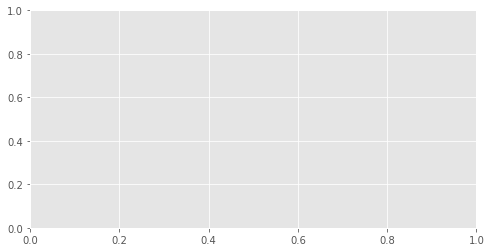

In [84]:
# Compute confusion matrix
import matplotlib.pyplot as plt  # doctest: +SKIP
from sklearn.datasets import make_classification
from sklearn.metrics import plot_confusion_matrix
cnf_matrix = confusion_matrix(Y_test, LR_yhat, labels=[1,0])
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.rcParams["figure.figsize"] = (8,4)
plot_confusion_matrix(cnf_matrix, inax=plt.gca(), classes=['SEVERITYCODE=1','SEVERITYCODE=0'],normalize= True,  title='Confusion Matrix (Logistic Regression)', cmap=plt.cm.Reds)
plt.savefig('./Fig19_confusion_matrix_LR.png', bbox_inches='tight')

In [2]:
#Make a figure showing the four confusion matrices
plt.rcParams["figure.figsize"] = (16,9)
plt.rc('xtick',labelsize=10)
plt.rc('ytick',labelsize=10)

#1 - Logistic regression
plt.subplot(2,2,1)
cnf_matrix = confusion_matrix(Y_test, LR_yhat, labels=[1,0])
plot_confusion_matrix(cnf_matrix, classes=['SEVERITYCODE=1','SEVERITYCODE=0'], inax=plt.gca(), normalize= True,  title='Confusion Matrix (Logistic Regression)', cmap=plt.cm.Reds)

#2 - Decision Tree
plt.subplot(2,2,2)
cnf_matrix = confusion_matrix(Y_test, DT_yhat, labels=[1,0])
plot_confusion_matrix(cnf_matrix, classes=['SEVERITYCODE=1','SEVERITYCODE=0'], inax=plt.gca(), normalize= True,  title='Confusion Matrix (Decision Tree)', cmap=plt.cm.Reds)

#3 - Support Vector Machine
plt.subplot(2,2,3)
cnf_matrix = confusion_matrix(Y_test, SVM_yhat, labels=[1,0])
plot_confusion_matrix(cnf_matrix, classes=['SEVERITYCODE=1','SEVERITYCODE=0'], inax=plt.gca(), normalize= True,  title='Confusion Matrix (SVM)', cmap=plt.cm.Reds)

#4 - k-Nearest Neighbours
plt.subplot(2,2,4)
cnf_matrix = confusion_matrix(Y_test, kNN_yhat, labels=[1,0])
plot_confusion_matrix(cnf_matrix, classes=['SEVERITYCODE=1','SEVERITYCODE=0'], inax=plt.gca(), normalize= True,  title='Confusion Matrix (kNN)', cmap=plt.cm.Reds)

plt.savefig('./Fig20_confusion_matrix_all.png', bbox_inches='tight')

NameError: ignored

##### *Decision Tree model.*
Decision tree models identify the key features on which the data can be partitioned (and the thresholds at which to partition the data) in the hope of arriving, after some iterations, at “leaves” which contain only accidents belonging to one target variable value (in this case, accident severity code). A decision tree model was trained on the data according to the “entropy” criterion⁴, and allowed to run until covergence. The final decision tree is 30 branch-layers deep (from the data feature set of 60 features), the top four layers of which are shown below. The decision tree correctly predicts SEVERITYCODE=1 62% of the time, correctly predicts SEVERITYCODE=0 69% of the time and has F1 scores of 0.66 and 0.67 for the two accident classifications. According to the decision tree model, the top three features for determining the likelihood of an accident having severe consequences are (i) the number of vehicles involved, (ii) the number of pedestrians involved, and (iii) whether or not one or more drivers were speeding.

In [4]:
from sklearn.tree import DecisionTreeClassifier
DT_model = DecisionTreeClassifier(criterion="entropy")#, max_depth = 8)
DT_model.fit(X_train,Y_train)

NameError: ignored

In [87]:
#Prediction
DT_yhat = DT_model.predict(X_test)

In [88]:
#Model evaluation
from sklearn import metrics
from sklearn.metrics import jaccard_similarity_score
from sklearn.metrics import f1_score
from sklearn.metrics import log_loss
from sklearn.metrics import r2_score
from sklearn.metrics import classification_report, confusion_matrix

print("Accuracy of Decision Tree model:")
print("Train set Accuracy: ", metrics.accuracy_score(Y_train, DT_model.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(Y_test, DT_yhat))
print("Jaccard index: %.2f" % jaccard_similarity_score(Y_test, DT_yhat))
print("F1-score: %.2f" % f1_score(Y_test, DT_yhat, average='weighted') )
print("R2-score: %.2f" % r2_score(DT_yhat , Y_test) )
print(classification_report(Y_test, DT_yhat))

Accuracy of Decision Tree model:
Train set Accuracy:  1.0
Test set Accuracy:  0.631979695431472
Jaccard index: 0.63
F1-score: 0.63
R2-score: -0.47
              precision    recall  f1-score   support

           0       0.62      0.65      0.63       193
           1       0.65      0.62      0.63       201

    accuracy                           0.63       394
   macro avg       0.63      0.63      0.63       394
weighted avg       0.63      0.63      0.63       394



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:664: FutureWarning: jaccard_similarity_score has been deprecated and replaced with jaccard_score. It will be removed in version 0.23. This implementation has surprising behavior for binary and multiclass classification tasks.
  FutureWarning)


In [ ]:
!conda install -c conda-forge pydotplus -y

plt.rcParams["figure.figsize"] = (16,24)

#Visualise the decision tree
from sklearn.externals.six import StringIO
import pydotplus
import matplotlib.image as mpimg
from sklearn import tree
%matplotlib inline 

#Plot top 5 branches of decision tree
dot_data = StringIO()
filename = "./Fig14_accident_tree.png"
featureNames = Feature.columns
targetNames = str(Y.unique().tolist())
out=tree.export_graphviz(DT_model,feature_names=featureNames, out_file=dot_data, class_names=targetNames, filled=True,  special_characters=True,rotate=False)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(filename)
img = mpimg.imread(filename)
plt.figure(figsize=(800, 200))
plt.imshow(img,interpolation='nearest')

/bin/bash: conda: command not found


/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


In [1]:
#Show only the first four layers of the decision tree
plt.rcParams["figure.figsize"] = (16,24)

#Visualise the decision tree
from sklearn.externals.six import StringIO
import pydotplus
import matplotlib.image as mpimg
from sklearn import tree
%matplotlib inline 

#Plot top 5 branches of decision tree
dot_data = StringIO()
filename = "./Fig14_accident_tree_shallow.png"
featureNames = Feature.columns
targetNames = str(Y.unique().tolist())
out=tree.export_graphviz(DT_model, max_depth=3, feature_names=featureNames, out_file=dot_data, class_names=targetNames, filled=True,  special_characters=True,rotate=False)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(filename)
img = mpimg.imread(filename)
plt.figure(figsize=(800, 200))
plt.imshow(img,interpolation='nearest')

NameError: ignored

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import itertools
def plot_confusion_matrix(cm, classes, inax,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.grid(b=None)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar(ax=inax)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if i == 0:
            ipos = i+0.25
        else:
            ipos = i-0.25
        plt.text(j, ipos, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 verticalalignment="center",
                 color="white" if cm[i, j] > thresh else "black",
                fontsize=16)
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [ ]:
# Compute confusion matrix
cnf_matrix = confusion_matrix(Y_test, DT_yhat, labels=[1,0])
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.rcParams["figure.figsize"] = (8,4)
plot_confusion_matrix(cnf_matrix, classes=['SEVERITYCODE=1','SEVERITYCODE=0'], inax=plt.gca(), normalize= True,  title='Confusion Matrix (Decision Tree)', cmap=plt.cm.Reds)
plt.savefig('./Fig15_confusion_matrix_DT.png', bbox_inches='tight')

##### *Support Vector Machine (SVM) model.*
SVM models seek to separate data based on different values of the target variable by mapping the dataset to a higher-dimension space and identifying the support vectors which best-describe the hyper planes that most effectively partition the data. An SVM model was built using the scikit learn C-Support Vector Classification method (svm.svc), with a linear mapping kernel employed in order that the model could return a list of the features with the most diagnostic power for determining accident severity. The SVM model correctly predicts SEVERITYCODE=1 70% of the time, correctly predicts SEVERITYCODE=0 82% of the time, and has F1 scores of 0.76 and 0.75 for both accident outcomes. Like the decision tree model, SVM finds that two of the top three most crucial features are (i) the number of pedestrians involved, and (ii) whether or not a driver was speeding. SVM also identifies the accident type “head on collision; both vehicles moving” to be a major factor in accident severity.

In [ ]:
from sklearn import svm
SVM_model = svm.SVC(kernel='linear')
SVM_model.fit(X_train, Y_train)

In [ ]:
SVM_yhat = SVM_model.predict(X_test)

In [ ]:
#Model evaluation
print("Accuracy of SVM model:")
print("Train set Accuracy: ", metrics.accuracy_score(Y_train, SVM_model.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(Y_test, SVM_yhat))
print("Jaccard index: %.2f" % jaccard_similarity_score(Y_test, SVM_yhat))
print("F1-score: %.2f" % f1_score(Y_test, SVM_yhat, average='weighted') )
print("R2-score: %.2f" % r2_score(SVM_yhat , Y_test) )
print(classification_report(Y_test, SVM_yhat))

In [ ]:
pd.Series(abs(SVM_model.coef_[0]), index=Feature.columns).nlargest(10).plot(kind='barh')
plt.savefig('./ZZ_SVM_features.png', bbox_inches='tight')

In [ ]:
# Compute confusion matrix
cnf_matrix = confusion_matrix(Y_test, SVM_yhat, labels=[1,0])
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.rcParams["figure.figsize"] = (8,4)
plot_confusion_matrix(cnf_matrix, inax=plt.gca(), classes=['SEVERITYCODE=1','SEVERITYCODE=0'],normalize= True,  title='Confusion Matrix (SVM)', cmap=plt.cm.Reds)
plt.savefig('./Fig16_confusion_matrix_SVM.png', bbox_inches='tight')

##### *k-Nearest Neighbours (kNN) model.*
kNN models seek to categorise the outcome of an unknown data sample based on its proximity in the multi-dimensional hyperspace of the feature set to its “k” nearest neighbours, which have known outcomes. Establishing the value of “k” which optimises the model’s accuracy (between 1 and the total number of samples in the dataset) is an empirical undertaking: if too-few neighbouring datapoints are used, the model is susceptible to being dominated by noise, however if too many neighbours are included in the classification, the model risks losing all diagnostic power completely. kNN models were built for k=1–300 using the kNeighborsClassifier function from scikit learn. The model is optimised at k=25 (see below), at which the model correctly predicts accident severity code 1 and 0 62% and 87% of the time, respectively. The F1 scores of the two accident outcomes are 0.76 and 0.71.

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

from sklearn.neighbors import KNeighborsClassifier

def getbestk(k_in):
    #Train and predict
    kNN_model = KNeighborsClassifier(n_neighbors=k_in).fit(X_train,Y_train)
    yhat = kNN_model.predict(X_test)  
    mean_acc=np.mean(yhat==Y_test);
    std_acc=np.std(yhat==Y_test)/np.sqrt(yhat.shape[0])
    outstring = str(mean_acc)+" "+str(std_acc)
    return outstring

In [ ]:
Ks = 300
k_arr = np.arange(Ks)+1
kNN_df = pd.DataFrame({'K': k_arr})
kNN_df["SCORE_STRING"] = 0

print("Run the kNN model for k=0--"+str(Ks)+" in order to choose the best Ks")
with concurrent.futures.ProcessPoolExecutor(num_processes) as pool:
    kNN_df["SCORE_STRING"] = list(tqdm(pool.map(getbestk, kNN_df["K"], chunksize=10), total=kNN_df.shape[0]))
        
#Split the score string based on whitespace
kNN_df[["MEAN_ACC", "STD_ACC"]] = kNN_df.SCORE_STRING.str.split(expand=True)
kNN_df["MEAN_ACC"] = kNN_df.MEAN_ACC.astype(float)
kNN_df["STD_ACC"] = kNN_df.STD_ACC.astype(float)

#Convert DataFrame back to Numpy arrays
mean_acc_column = kNN_df.loc[:,"MEAN_ACC"]
mean_acc = mean_acc_column.values
std_acc_column = kNN_df.loc[:,"STD_ACC"]
std_acc = std_acc_column.values

In [ ]:
plt.rcParams["figure.figsize"] = (16,8)

plt.rc('xtick',labelsize=18)
plt.rc('ytick',labelsize=18)

plt.plot(k_arr,mean_acc,'g' , color='#37777D')
plt.fill_between(k_arr,mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10, color='#37777D')
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.setp(plt.gca().get_legend().get_texts(), fontsize='18')
plt.ylabel('Accuracy', size=28)
plt.xlabel('Number of Neighbours (K)', size=28)

plt.tight_layout()
plt.savefig('./Fig17_kNN_best_K.png', bbox_inches='tight')

In [ ]:
print("The best accuracy was with", mean_acc.max(), "with k=", mean_acc.argmax()+1)

In [ ]:
#Re-run the model with the best K  
print("Fitting with k="+str(mean_acc.argmax()+1))
kNN_model = KNeighborsClassifier(n_neighbors=mean_acc.argmax()+1).fit(X_train,Y_train)
kNN_yhat = kNN_model.predict(X_test)  
kNN_model

In [ ]:
#Model evaluation
print("Accuracy of kNN model:")
print("Train set Accuracy: ", metrics.accuracy_score(Y_train, kNN_model.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(Y_test, kNN_yhat))
print("Jaccard index: %.2f" % jaccard_similarity_score(Y_test, kNN_yhat))
print("F1-score: %.2f" % f1_score(Y_test, kNN_yhat, average='weighted') )
print("R2-score: %.2f" % r2_score(kNN_yhat , Y_test) )
print(classification_report(Y_test, kNN_yhat))

In [ ]:
#Return plot parameters to their normal values
#plt.rc('xtick',labelsize=10)
#plt.rc('ytick',labelsize=10)

# Compute confusion matrix
cnf_matrix = confusion_matrix(Y_test, kNN_yhat, labels=[1,0])
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
#plt.figure()
plt.rcParams["figure.figsize"] = (8,4)
plt.rc('xtick',labelsize=10)
plt.rc('ytick',labelsize=10)

plot_confusion_matrix(cnf_matrix, inax=plt.gca(), classes=['SEVERITYCODE=1','SEVERITYCODE=0'],normalize= True,  title='Confusion Matrix (kNN)', cmap=plt.cm.Reds)
plt.savefig('./Fig18_confusion_matrix_kNN.png', bbox_inches='tight')

In [ ]:
knn_y_scores = kNN_model.predict_proba(X_test)
knn_fpr, knn_tpr, threshold = roc_curve(Y_test, knn_y_scores[:, 1])
knn_roc_auc = auc(knn_fpr, knn_tpr)

plt.title('Receiver Operating Characteristic (KNN)')
plt.plot(knn_fpr, knn_tpr, 'b', label = 'AUC = %0.2f' % knn_roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC Curve of kNN')
plt.show()

### Conclusion section where you conclude the report.

Car accident data for the city of Seattle between 2004–2019 have been used to train and evaluate machine learning models for predicting accident severity based on the circumstances of the accident. Four classes of models have been trained and evaluated: (i) Logistic Regression, (ii) Decision Tree, (iii) Support Vector Machine ant (iv) k-Nearest Neighbours. The Logistic Regression and SVM models perform best, having average F1 scores of 0.765 and 0.755, respectively. The kNN model has an average F1 score of 0.735. The Decision Tree model performs poorest, with an average F1 score of 0.665.
One of the major advantages of the SVM model is its ability (if using a linear mapping kernel) to de-project the fitted support vectors back to the original parameter space in order to determine which features in the initial dataset offer the most diagnostic power. The SVM model highlights that accidents involving pedestrians, accidents involving excess speed and head-on collisions between moving vehicles have particularly severe outcomes. Despite the tiny fraction of accidents in the Seattle area which occurred on icy roads, the SVM model was still able to determine that when conditions are icy, the risk of severe accident outcomes is increased.
This work highlights that machine learning techniques can be used to probe historical data in order to make reliable predictions about the outcome of road traffic accidents, given information which is available at the time when an accident is reported. This model can be extended to include new features or applied to accident databases in other cities/regions. By doing so, city planners can gain insight into the road conditions/features which are associated with high accident severity, and use this insight to improve road design. Additionally, by predicting accident severity as functions of weather, date, location and road conditions, this model may be able to help aid the decision making of emergency services call handlers, by allowing them to prioritise resources toward collisions with a greater likelihood of severe consequences.
This blog post summarises the work of a peer-reviewed IBM Data Science Capstone project.

## 3.- Your choice of a presentation or blogpost. (10 marks)